# Avance Proyecto

In [5]:
!pip install scrapy

You should consider upgrading via the 'c:\python37\python.exe -m pip install --upgrade pip' command.


In [2]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

## Datasets

### Dataset 1: Sea Level

d002 -> Tarakawa, Kiribati (1.3320m 172.01300)
d003 -> Baltra, Ecuador (-0.43700, -90.28500)
d004 -> Nauru, Nauru (-0.52800, 166.90500)
d011 -> Christmas, Kiribati (1.98500, -157.47700)
d013 -> Kanton, Kiribati (-2.81000, -171.71800)
d029 -> Kapingamarangi, Micronesia (1.09800, 154.77700) 
d030 -> Santa Cruz, Ecuador (-0.75500, -90.31300)
d091 -> La Libertad, Ecuador (-2.20000, -80.91700)
d092 -> Talara, Peru (-4.58200, -81.28200)
d400 -> Lombrum, Papua New Guinea (-2.03300, 147.36700)

In [25]:
# Merge dataframe de cada estacion

df = pd.read_csv('data/sea level center/d002.csv', names=['Year', 'Month', 'Day', 'd002'])
df.head()

df_names = ['d003', 'd004', 'd011', 'd013', 'd029', 'd030', 'd091', 'd092', 'd400']

for n in df_names:
    path = 'data/sea level center/{}.csv'.format(n)
    d_right = pd.read_csv(path, names=['Year', 'Month', 'Day', n])
    df = df.merge(d_right, how='outer', on=['Year', 'Month', 'Day'])

df.sort_values(by=['Year', 'Month', 'Day'], inplace=True)
df.reset_index(inplace=True, drop=True)



In [5]:
df # Dataframe de todas las estaciones

,Year,Month,Day,d002,d003,d004,d011,d013,d029,d030,d091,d092,d400
0,1949,9,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2166.0,NaN,NaN
1,1949,9,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2185.0,NaN,NaN
2,1949,9,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2092.0,NaN,NaN
3,1949,9,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2081.0,NaN,NaN
4,1949,9,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2130.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
26230,2021,6,26,1692.0,1880.0,1507.0,NaN,1071.0,1029.0,1522.0,NaN,NaN,794.0
26231,2021,6,27,1672.0,1905.0,1473.0,NaN,1052.0,1014.0,1512.0,NaN,NaN,790.0
26232,2021,6,28,1658.0,1914.0,1460.0,NaN,1040.0,NaN,1509.0,NaN,NaN,802.0
26233,2021,6,29,1678.0,1922.0,1480.0,NaN,1072.0,NaN,1504.0,NaN,NaN,814.0


### Dataset 2 - Average Sea Surface Temperature

In [26]:
# Dataframe de 1997 

# Dataframe desde longitud 140 hasta 179.5
df_sst_1997 = pd.read_csv('https://coastwatch.pfeg.noaa.gov/erddap/griddap/erdHadISST.csv?sst%5B(1997-01-01T12:00:00Z):1:(1997-12-31T23:59:59Z)%5D%5B(5):1:(-5)%5D%5B(140):1:(179.5)%5D')

df_sst_1997.dropna(inplace=True)

# Dataframe desde longitud -179.5 hasta -80

df_sst2 = pd.read_csv('https://coastwatch.pfeg.noaa.gov/erddap/griddap/erdHadISST.csv?sst%5B(1997-01-01T12:00:00Z):1:(1997-12-31T23:59:59Z)%5D%5B(5):1:(-5)%5D%5B(-179.5):1:(-77)%5D')
df_sst2.dropna(inplace=True)

# Merge dataframes


df_sst_1997 = df_sst_1997.merge(df_sst2, how='outer', on=['time','latitude','longitude','sst'])

df_sst_1997.drop([0], inplace=True) #Primera fila es un header
df_sst_1997.reset_index(inplace=True, drop=True)

# Fixing data types
df_sst_1997['time'] = pd.to_datetime(df_sst_1997['time']) #Data type -> datetime
df_sst_1997['latitude'] = df_sst_1997['latitude'].astype(float)
df_sst_1997['longitude'] = df_sst_1997['longitude'].astype(float)
df_sst_1997['sst'] = df_sst_1997['sst'].astype(float)

df_sst_1997


,time,latitude,longitude,sst
0,1997-01-16 12:00:00+00:00,5.5,140.5,28.769217
1,1997-01-16 12:00:00+00:00,5.5,141.5,28.805550
2,1997-01-16 12:00:00+00:00,5.5,142.5,28.946290
3,1997-01-16 12:00:00+00:00,5.5,143.5,29.103340
4,1997-01-16 12:00:00+00:00,5.5,144.5,29.271656
...,...,...,...,...
20067,1998-01-16 12:00:00+00:00,-4.5,-85.5,28.673662
20068,1998-01-16 12:00:00+00:00,-4.5,-84.5,28.678600
20069,1998-01-16 12:00:00+00:00,-4.5,-83.5,28.560375
20070,1998-01-16 12:00:00+00:00,-4.5,-82.5,28.400507


In [27]:
# Dataframe de 2015

# Dataframe desde longitud 140 hasta 179.5
df_sst_2015 = pd.read_csv('https://coastwatch.pfeg.noaa.gov/erddap/griddap/erdHadISST.csv?sst%5B(2015-01-01T12:00:00Z):1:(2015-12-31T23:59:59Z)%5D%5B(5):1:(-5)%5D%5B(140):1:(179.5)%5D')

df_sst_2015.dropna(inplace=True)

# Dataframe desde longitud -179.5 hasta -80

df_sst2 = pd.read_csv('https://coastwatch.pfeg.noaa.gov/erddap/griddap/erdHadISST.csv?sst%5B(2015-01-01T12:00:00Z):1:(2015-12-31T23:59:59Z)%5D%5B(5):1:(-5)%5D%5B(-179.5):1:(-77)%5D')
df_sst2.dropna(inplace=True)

# Merge dataframes


df_sst_2015 = df_sst_2015.merge(df_sst2, how='outer', on=['time','latitude','longitude','sst'])

df_sst_2015.drop([0], inplace=True) #Primera fila es un header
df_sst_2015.reset_index(inplace=True, drop=True)

df_sst_2015['time'] = pd.to_datetime(df_sst_2015['time']) #Data type -> datetime
df_sst_2015['latitude'] = df_sst_2015['latitude'].astype(float)
df_sst_2015['longitude'] = df_sst_2015['longitude'].astype(float)
df_sst_2015['sst'] = df_sst_2015['sst'].astype(float)

df_sst_2015

,time,latitude,longitude,sst
0,2015-01-16 12:00:00+00:00,5.5,140.5,28.839882
1,2015-01-16 12:00:00+00:00,5.5,141.5,28.925926
2,2015-01-16 12:00:00+00:00,5.5,142.5,28.997150
3,2015-01-16 12:00:00+00:00,5.5,143.5,29.015670
4,2015-01-16 12:00:00+00:00,5.5,144.5,28.976440
...,...,...,...,...
20067,2016-01-16 12:00:00+00:00,-4.5,-85.5,26.835735
20068,2016-01-16 12:00:00+00:00,-4.5,-84.5,26.561320
20069,2016-01-16 12:00:00+00:00,-4.5,-83.5,26.238153
20070,2016-01-16 12:00:00+00:00,-4.5,-82.5,25.660004


### Dataset 3 - SODA - POP 2.2.4 Monthly Means, 1871-2010

In [3]:
df_actual = pd.read_csv('https://coastwatch.pfeg.noaa.gov/erddap/griddap/hawaii_d90f_20ee_c4cb.csvp?temp%5B(1984-01-15):1:(2010-12-15)%5D%5B(5.01):1:(5.01)%5D%5B(-5):1:(5)%5D%5B(135):1:(280)%5D,salt%5B(1984-01-15):1:(2010-12-15)%5D%5B(5.01):1:(5.01)%5D%5B(-5):1:(5)%5D%5B(135):1:(280)%5D,u%5B(1984-01-15):1:(2010-12-15)%5D%5B(5.01):1:(5.01)%5D%5B(-5):1:(5)%5D%5B(135):1:(280)%5D,v%5B(1984-01-15):1:(2010-12-15)%5D%5B(5.01):1:(5.01)%5D%5B(-5):1:(5)%5D%5B(135):1:(280)%5D')
df_actual.head()

,time (UTC),depth (m),latitude (degrees_north),longitude (degrees_east),temp (degree_C),salt (PSU),u (m s-1),v (m s-1)
0,1984-01-15T00:00:00Z,5.01,-4.75,135.25,29.562305,34.071102,-0.263516,0.037770
1,1984-01-15T00:00:00Z,5.01,-4.75,135.75,29.568815,34.054290,-0.134401,0.084723
2,1984-01-15T00:00:00Z,5.01,-4.75,136.25,29.559784,34.039494,-0.001687,0.000681
3,1984-01-15T00:00:00Z,5.01,-4.75,136.75,29.567688,34.009098,-0.000511,0.000327
4,1984-01-15T00:00:00Z,5.01,-4.75,137.25,29.717936,33.960155,-0.000112,0.000096


In [8]:
df_actual.dropna()

,time (UTC),depth (m),latitude (degrees_north),longitude (degrees_east),temp (degree_C),salt (PSU),u (m s-1),v (m s-1)
0,1984-01-15T00:00:00Z,5.01,-4.75,135.25,29.562305,34.071102,-0.263516,0.037770
1,1984-01-15T00:00:00Z,5.01,-4.75,135.75,29.568815,34.054290,-0.134401,0.084723
2,1984-01-15T00:00:00Z,5.01,-4.75,136.25,29.559784,34.039494,-0.001687,0.000681
3,1984-01-15T00:00:00Z,5.01,-4.75,136.75,29.567688,34.009098,-0.000511,0.000327
4,1984-01-15T00:00:00Z,5.01,-4.75,137.25,29.717936,33.960155,-0.000112,0.000096
...,...,...,...,...,...,...,...,...
1979959,2010-12-15T00:00:00Z,5.01,5.25,278.25,27.036180,31.926990,0.014610,-0.099370
1979960,2010-12-15T00:00:00Z,5.01,5.25,278.75,26.992218,31.670920,0.014967,-0.154748
1979961,2010-12-15T00:00:00Z,5.01,5.25,279.25,26.827795,31.775766,0.019515,-0.171746
1979962,2010-12-15T00:00:00Z,5.01,5.25,279.75,26.704010,31.990660,0.024214,-0.146778


In [4]:
df_previo = pd.read_csv('https://coastwatch.pfeg.noaa.gov/erddap/griddap/hawaii_d90f_20ee_c4cb.csvp?temp%5B(1970-01-15):1:(1984-01-15)%5D%5B(5.01):1:(5.01)%5D%5B(-5):1:(5)%5D%5B(135):1:(280)%5D,salt%5B(1970-01-15):1:(1984-01-15)%5D%5B(5.01):1:(5.01)%5D%5B(-5):1:(5)%5D%5B(135):1:(280)%5D,u%5B(1970-01-15):1:(1984-01-15)%5D%5B(5.01):1:(5.01)%5D%5B(-5):1:(5)%5D%5B(135):1:(280)%5D,v%5B(1970-01-15):1:(1984-01-15)%5D%5B(5.01):1:(5.01)%5D%5B(-5):1:(5)%5D%5B(135):1:(280)%5D')
df_previo.head()

,time (UTC),depth (m),latitude (degrees_north),longitude (degrees_east),temp (degree_C),salt (PSU),u (m s-1),v (m s-1)
0,1970-01-15T00:00:00Z,5.01,-4.75,135.25,28.673958,34.297750,-0.065552,0.040507
1,1970-01-15T00:00:00Z,5.01,-4.75,135.75,28.813316,34.307297,-0.021287,0.046534
2,1970-01-15T00:00:00Z,5.01,-4.75,136.25,28.896774,34.328700,-0.000599,0.000461
3,1970-01-15T00:00:00Z,5.01,-4.75,136.75,28.954433,34.320860,-0.000095,0.000340
4,1970-01-15T00:00:00Z,5.01,-4.75,137.25,29.061314,34.258873,0.000005,0.000036


In [10]:
df_previo.dropna()

,time (UTC),depth (m),latitude (degrees_north),longitude (degrees_east),temp (degree_C),salt (PSU),u (m s-1),v (m s-1)
0,1970-01-15T00:00:00Z,5.01,-4.75,135.25,28.673958,34.297750,-0.065552,0.040507
1,1970-01-15T00:00:00Z,5.01,-4.75,135.75,28.813316,34.307297,-0.021287,0.046534
2,1970-01-15T00:00:00Z,5.01,-4.75,136.25,28.896774,34.328700,-0.000599,0.000461
3,1970-01-15T00:00:00Z,5.01,-4.75,136.75,28.954433,34.320860,-0.000095,0.000340
4,1970-01-15T00:00:00Z,5.01,-4.75,137.25,29.061314,34.258873,0.000005,0.000036
...,...,...,...,...,...,...,...,...
1032754,1984-01-15T00:00:00Z,5.01,5.25,278.25,27.763294,31.579021,-0.121054,-0.239616
1032755,1984-01-15T00:00:00Z,5.01,5.25,278.75,27.750505,31.777887,-0.126866,-0.286342
1032756,1984-01-15T00:00:00Z,5.01,5.25,279.25,27.608301,32.099182,-0.133068,-0.313705
1032757,1984-01-15T00:00:00Z,5.01,5.25,279.75,27.279272,32.241817,-0.127870,-0.308923


In [11]:
df_previo

,time (UTC),depth (m),latitude (degrees_north),longitude (degrees_east),temp (degree_C),salt (PSU),u (m s-1),v (m s-1)
0,1970-01-15T00:00:00Z,5.01,-4.75,135.25,28.673958,34.297750,-0.065552,0.040507
1,1970-01-15T00:00:00Z,5.01,-4.75,135.75,28.813316,34.307297,-0.021287,0.046534
2,1970-01-15T00:00:00Z,5.01,-4.75,136.25,28.896774,34.328700,-0.000599,0.000461
3,1970-01-15T00:00:00Z,5.01,-4.75,136.75,28.954433,34.320860,-0.000095,0.000340
4,1970-01-15T00:00:00Z,5.01,-4.75,137.25,29.061314,34.258873,0.000005,0.000036
...,...,...,...,...,...,...,...,...
1032754,1984-01-15T00:00:00Z,5.01,5.25,278.25,27.763294,31.579021,-0.121054,-0.239616
1032755,1984-01-15T00:00:00Z,5.01,5.25,278.75,27.750505,31.777887,-0.126866,-0.286342
1032756,1984-01-15T00:00:00Z,5.01,5.25,279.25,27.608301,32.099182,-0.133068,-0.313705
1032757,1984-01-15T00:00:00Z,5.01,5.25,279.75,27.279272,32.241817,-0.127870,-0.308923


### Dataset 4 - ONI

In [1]:
import scrapy

from scrapy.linkextractors.lxmlhtml import LxmlLinkExtractor
from scrapy.spiders import Rule, CrawlSpider
from scrapy.http import Request
from scrapy.exceptions import CloseSpider

class YearItem(scrapy.Item):
    DJF = scrapy.Field()
    JFM = scrapy.Field()
    FMA = scrapy.Field()
    MAM = scrapy.Field()
    AMJ = scrapy.Field()
    MJJ = scrapy.Field()
    JJA = scrapy.Field()
    JAS = scrapy.Field()
    ASO = scrapy.Field()
    SON = scrapy.Field()
    OND = scrapy.Field()
    NDJ = scrapy.Field()
    anio = scrapy.Field()

class ClimaSpider(scrapy.Spider):
    """
    This CrawlSpider will get information about jobs. It will navigate through the links of the page
    """
    name = 'clima'
    start_urls = ['https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_v5.php']
    
    
    
    
    
    def parse(self, response):
        """
        This function takes the information from each page and return the items in the catalog.
        """
        self.logger.info('Now we are crawling: %s', response.url)
        print(response.xpath('//html'))
        i=0
        for row in response.xpath('//table[@align="center"][@border=1]//tr'):
          i+=1
          if (i-1) % 11 == 0:
            pass
          else:
            year = YearItem()
            year['anio']       = response.xpath('//table[@align="center"][@border=1]//tr['+str(i)+']/td[1]//strong/text()').get()
            year['DJF']      = response.xpath('//table[@align="center"][@border=1]//tr['+str(i)+']/td[2]//font/text()').get()
            year['JFM']    = response.xpath('//table[@align="center"][@border=1]//tr['+str(i)+']/td[3]//font/text()').get()
            year['FMA']      = response.xpath('//table[@align="center"][@border=1]//tr['+str(i)+']/td[4]//font/text()').get()
            year['MAM']      = response.xpath('//table[@align="center"][@border=1]//tr['+str(i)+']/td[5]//font/text()').get()
            year['AMJ']       = response.xpath('//table[@align="center"][@border=1]//tr['+str(i)+']/td[6]//font/text()').get()
            year['MJJ']      = response.xpath('//table[@align="center"][@border=1]//tr['+str(i)+']/td[7]//font/text()').get()
            year['JJA']      = response.xpath('//table[@align="center"][@border=1]//tr['+str(i)+']/td[8]//font/text()').get()
            year['JAS']     = response.xpath('//table[@align="center"][@border=1]//tr['+str(i)+']/td[9]//font/text()').get()
            year['ASO'] = response.xpath('//table[@align="center"][@border=1]//tr['+str(i)+']/td[10]//font/text()').get()
            year['SON']    = response.xpath('//table[@align="center"][@border=1]//tr['+str(i)+']/td[11]//font/text()').get()
            year['OND']  = response.xpath('//table[@align="center"][@border=1]//tr['+str(i)+']/td[12]//font/text()').get()
            year['NDJ']  = response.xpath('//table[@align="center"][@border=1]//tr['+str(i)+']/td[13]//font/text()').get()
            
            yield year
    

In [2]:
from scrapy.crawler import CrawlerProcess

process = CrawlerProcess(settings={
           'FEEDS': {
               'clima.csv' : {
                   'format' : 'csv',
                   'fields': ['anio', 'DJF', 'JFM', 'FMA', 'MAM', 'AMJ', 'MJJ', 'JJA', 'JAS', 'ASO', 'SON', 'OND', 'NDJ']
               }
           }
          }
    )

process.crawl( ClimaSpider )
process.start()

2021-08-15 16:24:27 [scrapy.utils.log] INFO: Scrapy 2.5.0 started (bot: scrapybot)
2021-08-15 16:24:27 [scrapy.utils.log] INFO: Versions: lxml 4.6.3.0, libxml2 2.9.5, cssselect 1.1.0, parsel 1.6.0, w3lib 1.22.0, Twisted 21.2.0, Python 3.7.7 (tags/v3.7.7:d7c567b08f, Mar 10 2020, 10:41:24) [MSC v.1900 64 bit (AMD64)], pyOpenSSL 20.0.1 (OpenSSL 1.1.1k  25 Mar 2021), cryptography 3.4.7, Platform Windows-10-10.0.19041-SP0
2021-08-15 16:24:27 [scrapy.utils.log] DEBUG: Using reactor: twisted.internet.selectreactor.SelectReactor
2021-08-15 16:24:27 [scrapy.crawler] INFO: Overridden settings:
{}
2021-08-15 16:24:27 [scrapy.extensions.telnet] INFO: Telnet Password: 7bbb90d705b025ee
2021-08-15 16:24:27 [scrapy.middleware] INFO: Enabled extensions:
['scrapy.extensions.corestats.CoreStats',
 'scrapy.extensions.telnet.TelnetConsole',
 'scrapy.extensions.feedexport.FeedExporter',
 'scrapy.extensions.logstats.LogStats']
2021-08-15 16:24:27 [scrapy.middleware] INFO: Enabled downloader middlewares:
['sc

[<Selector xpath='//html' data='<html>\n\n<!-- \tClimate Prediction Cent...'>]


2021-08-15 16:24:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_v5.php>
{'AMJ': '-0.3',
 'ASO': '-0.1',
 'DJF': '-0.2',
 'FMA': '-0.2',
 'JAS': '-0.1',
 'JFM': '-0.2',
 'JJA': '0.0',
 'MAM': '-0.3',
 'MJJ': '-0.2',
 'NDJ': '-0.4',
 'OND': '-0.3',
 'SON': '-0.2',
 'anio': '1962'}
2021-08-15 16:24:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_v5.php>
{'AMJ': '0.3',
 'ASO': '1.2',
 'DJF': '-0.4',
 'FMA': '0.2',
 'JAS': '1.1',
 'JFM': '-0.2',
 'JJA': '0.9',
 'MAM': '0.3',
 'MJJ': '0.5',
 'NDJ': '1.3',
 'OND': '1.4',
 'SON': '1.3',
 'anio': '1963'}
2021-08-15 16:24:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_v5.php>
{'AMJ': '-0.6',
 'ASO': '-0.8',
 'DJF': '1.1',
 'FMA': '0.1',
 'JAS': '-0.7',
 'JFM': '0.6',
 'JJA': '-0.6',
 'MAM': '-0.3',
 'MJJ': '-0.6',

2021-08-15 16:24:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_v5.php>
{'AMJ': '-0.1',
 'ASO': '0.7',
 'DJF': '-0.5',
 'FMA': '-0.3',
 'JAS': '0.4',
 'JFM': '-0.5',
 'JJA': '0.2',
 'MAM': '-0.2',
 'MJJ': '0.0',
 'NDJ': '1.2',
 'OND': '1.1',
 'SON': '0.9',
 'anio': '1986'}
2021-08-15 16:24:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_v5.php>
{'AMJ': '1.0',
 'ASO': '1.6',
 'DJF': '1.2',
 'FMA': '1.1',
 'JAS': '1.7',
 'JFM': '1.2',
 'JJA': '1.5',
 'MAM': '0.9',
 'MJJ': '1.2',
 'NDJ': '1.1',
 'OND': '1.3',
 'SON': '1.5',
 'anio': '1987'}
2021-08-15 16:24:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_v5.php>
{'AMJ': '-0.9',
 'ASO': '-1.2',
 'DJF': '0.8',
 'FMA': '0.1',
 'JAS': '-1.1',
 'JFM': '0.5',
 'JJA': '-1.3',
 'MAM': '-0.3',
 'MJJ': '-1.3',
 'NDJ':

2021-08-15 16:24:29 [scrapy.core.scraper] DEBUG: Scraped from <200 https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_v5.php>
{'AMJ': '-0.2',
 'ASO': '-1.6',
 'DJF': '1.5',
 'FMA': '0.8',
 'JAS': '-1.3',
 'JFM': '1.2',
 'JJA': '-1.0',
 'MAM': '0.4',
 'MJJ': '-0.7',
 'NDJ': '-1.6',
 'OND': '-1.6',
 'SON': '-1.6',
 'anio': '2010'}
2021-08-15 16:24:29 [scrapy.core.scraper] DEBUG: Scraped from <200 https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_v5.php>
{'AMJ': '-0.6',
 'ASO': '-0.8',
 'DJF': '-1.4',
 'FMA': '-0.9',
 'JAS': '-0.6',
 'JFM': '-1.2',
 'JJA': '-0.5',
 'MAM': '-0.7',
 'MJJ': '-0.4',
 'NDJ': '-1.0',
 'OND': '-1.1',
 'SON': '-1.0',
 'anio': '2011'}
2021-08-15 16:24:29 [scrapy.core.scraper] DEBUG: Scraped from <200 https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_v5.php>
{'AMJ': '-0.3',
 'ASO': '0.4',
 'DJF': '-0.9',
 'FMA': '-0.6',
 'JAS': '0.4',
 'JFM': '-0.7',
 'JJA': '0.2',
 'MAM': '-0.5',
 'MJJ': 

In [8]:
df_ONI = pd.read_csv('clima.csv')
df_ONI.set_index('anio', inplace=True)
df_ONI.head()

,DJF,JFM,FMA,MAM,AMJ,MJJ,JJA,JAS,ASO,SON,OND,NDJ
anio,,,,,,,,,,,,
1950,-1.5,-1.3,-1.2,-1.2,-1.1,-0.9,-0.5,-0.4,-0.4,-0.4,-0.6,-0.8
1951,-0.8,-0.5,-0.2,0.2,0.4,0.6,0.7,0.9,1.0,1.2,1.0,0.8
1952,0.5,0.4,0.3,0.3,0.2,0.0,-0.1,0.0,0.2,0.1,0.0,0.1
1953,0.4,0.6,0.6,0.7,0.8,0.8,0.7,0.7,0.8,0.8,0.8,0.8
1954,0.8,0.5,0.0,-0.4,-0.5,-0.5,-0.6,-0.8,-0.9,-0.8,-0.7,-0.7


# Total de años en el dataset

In [15]:
len(df_ONI)

72

In [16]:
# Valores mayores a 0.5 -> Posible presencia de fenomeno El Niño
# df_ONI.max(axis=1)
df_ONI_Ninio = df_ONI.loc[df_ONI.max(axis=1)>= 0.5]
len(df_ONI_Ninio)

47

In [17]:
# Porcentaje de posibles años con Anomalias +0.5 (Niño)

(len(df_ONI_Ninio)*100)/len(df_ONI)


65.27777777777777

In [18]:
# Valores menores a -0.5 -> Posible presencia de fenomeno La Niña
df_ONI_Ninia = df_ONI.loc[df_ONI.min(axis=1)<= -0.5]
len(df_ONI_Ninia)

44

In [19]:
# Porcentaje de posibles años con Anomalias +0.5 (Niño)

(len(df_ONI_Ninia)*100)/len(df_ONI)

61.111111111111114

In [20]:
# Años con anomalias de El Niño y La Niña
df_ONI_Todos = df_ONI.loc[(df_ONI.max(axis=1)>= 0.5) & (df_ONI.min(axis=1)<= -0.5) ]
len(df_ONI_Todos)

24

In [21]:
# Valores mayores a 1.8 -> Niños extraordinarios
df_ONI_Ninio_Extra = df_ONI.loc[df_ONI.max(axis=1)>= 1.8]
len(df_ONI_Ninio_Extra)

10

In [44]:
df_ONI_Ninio_Extra

,DJF,JFM,FMA,MAM,AMJ,MJJ,JJA,JAS,ASO,SON,OND,NDJ
anio,,,,,,,,,,,,
1958,1.8,1.7,1.3,0.9,0.7,0.6,0.6,0.4,0.4,0.4,0.5,0.6
1965,-0.6,-0.3,-0.1,0.2,0.5,0.8,1.2,1.5,1.9,2.0,2.0,1.7
1972,-0.7,-0.4,0.1,0.4,0.7,0.9,1.1,1.4,1.6,1.8,2.1,2.1
1973,1.8,1.2,0.5,-0.1,-0.5,-0.9,-1.1,-1.3,-1.5,-1.7,-1.9,-2.0
1982,0.0,0.1,0.2,0.5,0.7,0.7,0.8,1.1,1.6,2.0,2.2,2.2
1983,2.2,1.9,1.5,1.3,1.1,0.7,0.3,-0.1,-0.5,-0.8,-1.0,-0.9
1997,-0.5,-0.4,-0.1,0.3,0.8,1.2,1.6,1.9,2.1,2.3,2.4,2.4
1998,2.2,1.9,1.4,1.0,0.5,-0.1,-0.8,-1.1,-1.3,-1.4,-1.5,-1.6
2015,0.5,0.5,0.5,0.7,0.9,1.2,1.5,1.9,2.2,2.4,2.6,2.6


In [22]:
df_ONI_Ninio_Extra.max(axis=1)

anio
1958    1.8
1965    2.0
1972    2.1
1973    1.8
1982    2.2
1983    2.2
1997    2.4
1998    2.2
2015    2.6
2016    2.5
dtype: float64

In [23]:
# Porcentaje de posibles años con anomalias de El Niño y La Niña

(len(df_ONI_Todos)*100)/len(df_ONI)

33.333333333333336

In [25]:
# Años con indice mayor de ONI por temporada
df_ONI.idxmax()


DJF    2016
JFM    2016
FMA    2016
MAM    1983
AMJ    1983
MJJ    1987
JJA    1997
JAS    1997
ASO    2015
SON    2015
OND    2015
NDJ    2015
dtype: int64

In [50]:
df_ONI.loc[1992]

DJF    1.7
JFM    1.6
FMA    1.5
MAM    1.3
AMJ    1.1
MJJ    0.7
JJA    0.4
JAS    0.1
ASO   -0.1
SON   -0.2
OND   -0.3
NDJ   -0.1
Name: 1992, dtype: float64

## 1) Relacion entre periodo de 1970-1984 a 1984-2020

In [30]:
# Dataframe dividido por años a investigar

# Dataframe 1970 a 1984
df_70_84 = df.loc[(df['Year']>=1970) & (df['Year']<=1984) ]

# Dataframe 1985 - 2020
df_85_20 = df.loc[ (df['Year']>1984) & (df['Year']<= 2020) ]

In [13]:
# Manejo de valores nulos en dataframe 1970 - 1984

# Solo se analizará la estacion 011, 013, 029, 030, 091 porque no existen datos en las otras estaciones
df_70_84 = df_70_84[['Year','Month','Day', 'd011', 'd013','d029','d030','d091']]
df_70_84.reset_index(inplace=True, drop=True)

# Manejo de valores atipicos (-32767
df_70_84.replace(-32767, np.NaN, inplace=True)#Reemplazar por calores atipicos por  NaN


# Se ha reemplazado estos valores por el promedio anual
df_70_84['d011'] = df_70_84['d011'].fillna(df_70_84.groupby('Year')['d011'].transform('mean'))
df_70_84['d013'] = df_70_84['d013'].fillna(df_70_84.groupby('Year')['d013'].transform('mean'))
df_70_84['d029'] = df_70_84['d029'].fillna(df_70_84.groupby('Year')['d029'].transform('mean'))
df_70_84['d030'] = df_70_84['d030'].fillna(df_70_84.groupby('Year')['d030'].transform('mean'))
df_70_84['d091'] = df_70_84['d091'].fillna(df_70_84.groupby('Year')['d091'].transform('mean'))


df_70_84

,Year,Month,Day,d011,d013,d029,d030,d091
0,1970,1,1,NaN,NaN,NaN,NaN,2242.0
1,1970,1,2,NaN,NaN,NaN,NaN,2232.0
2,1970,1,3,NaN,NaN,NaN,NaN,2210.0
3,1970,1,4,NaN,NaN,NaN,NaN,2197.0
4,1970,1,5,NaN,NaN,NaN,NaN,2194.0
...,...,...,...,...,...,...,...,...
5474,1984,12,27,637.0,1104.0,1063.0,1404.0,2381.0
5475,1984,12,28,624.0,1073.0,1068.0,1400.0,2357.0
5476,1984,12,29,645.0,1065.0,1074.0,1386.0,2341.0
5477,1984,12,30,646.0,1083.0,1077.0,1379.0,2356.0


In [14]:
df_70_84.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5479 entries, 0 to 5478
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Year    5479 non-null   int64  
 1   Month   5479 non-null   int64  
 2   Day     5479 non-null   int64  
 3   d011    4018 non-null   float64
 4   d013    4749 non-null   float64
 5   d029    2557 non-null   float64
 6   d030    2557 non-null   float64
 7   d091    5479 non-null   float64
dtypes: float64(5), int64(3)
memory usage: 342.6 KB


In [31]:
# Manejo de valores nulos en dataframe 1985 - 2020

df_85_20 = df_85_20[['Year','Month','Day', 'd011', 'd013','d029','d030','d091']]

# Manejo de valores atipicos (-32767
df_85_20.replace(-32767, np.NaN, inplace=True)#Reemplazar por calores atipicos por  NaN


# Se ha reemplazado estos valores por el promedio anual
df_85_20['d011'] = df_85_20['d011'].fillna(df_85_20.groupby('Year')['d011'].transform('mean'))
df_85_20['d013'] = df_85_20['d013'].fillna(df_85_20.groupby('Year')['d013'].transform('mean'))
df_85_20['d029'] = df_85_20['d029'].fillna(df_85_20.groupby('Year')['d029'].transform('mean'))
df_85_20['d030'] = df_85_20['d030'].fillna(df_85_20.groupby('Year')['d030'].transform('mean'))
df_85_20['d091'] = df_85_20['d091'].fillna(df_85_20.groupby('Year')['d091'].transform('mean'))

df_85_20.reset_index(inplace=True, drop=True)

df_85_20

,Year,Month,Day,d011,d013,d029,d030,d091
0,1985,1,1,628.0,1061.0,1048.000000,1431.0,2340.0
1,1985,1,2,640.0,1056.0,1094.000000,1438.0,2331.0
2,1985,1,3,622.0,1046.0,1099.000000,1415.0,2299.0
3,1985,1,4,611.0,1035.0,1068.000000,1413.0,2299.0
4,1985,1,5,623.0,1021.0,1077.000000,1406.0,2279.0
...,...,...,...,...,...,...,...,...
13144,2020,12,27,607.0,1076.0,1077.953368,1479.0,2380.0
13145,2020,12,28,596.0,1068.0,1077.953368,1482.0,2378.0
13146,2020,12,29,610.0,1083.0,1077.953368,1502.0,2400.0
13147,2020,12,30,637.0,1091.0,1132.000000,1497.0,2420.0


In [16]:
df_85_20.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13149 entries, 0 to 13148
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Year    13149 non-null  int64  
 1   Month   13149 non-null  int64  
 2   Day     13149 non-null  int64  
 3   d011    13149 non-null  float64
 4   d013    11689 non-null  float64
 5   d029    11688 non-null  float64
 6   d030    13149 non-null  float64
 7   d091    13149 non-null  float64
dtypes: float64(5), int64(3)
memory usage: 821.9 KB


### Visualizaciones

In [17]:
# Visualizacion de dataframe 1985 - 2020
df_p=df_85_20.dropna()
df_p = df_p[['Year','d011','d013', 'd029', 'd030', 'd091']].groupby('Year').mean()
df_p.reset_index(inplace=True)

df_p

,Year,d011,d013,d029,d030,d091
0,1985,693.638356,1039.522152,1023.859155,1402.147945,2372.041096
1,1986,741.400000,1025.328767,1009.590028,1453.970588,2423.232877
2,1987,724.084932,968.882192,872.174157,1514.115068,2484.435616
3,1988,536.887978,895.857923,959.311475,1375.232240,2380.412568
4,1989,654.123288,1009.539726,1036.232877,1424.126027,2419.249315
5,1990,724.419178,1086.556164,1010.071233,1454.145205,2394.032877
6,1991,744.669468,1086.827397,993.556164,1501.016438,2441.936986
7,1992,717.330579,1049.906336,883.073770,1516.872881,2478.811475
8,1993,700.731507,1058.632877,932.712329,1496.339726,2458.794521
9,1994,724.728767,1072.140884,996.205479,1466.539726,2448.427397


### Overview

In [18]:
df_anio_p = df_p.set_index('Year')


# df_ONI.set_index('anio', inplace=True)
df_anio_p.head()

,d011,d013,d029,d030,d091
Year,,,,,
1985,693.638356,1039.522152,1023.859155,1402.147945,2372.041096
1986,741.400000,1025.328767,1009.590028,1453.970588,2423.232877
1987,724.084932,968.882192,872.174157,1514.115068,2484.435616
1988,536.887978,895.857923,959.311475,1375.232240,2380.412568
1989,654.123288,1009.539726,1036.232877,1424.126027,2419.249315


In [16]:
len(df_anio_p)

29

In [17]:
df_anio_p.idxmax()

d011    2016
d013    2015
d029    2018
d030    1997
d091    2015
dtype: int64

In [25]:
df_anio_p.idxmin()

d011    1988
d013    1988
d029    1998
d030    1988
d091    1996
dtype: int64

In [26]:
df_anio_p.loc[2016]

d011     873.250000
d013    1069.434426
d029    1004.505464
d030    1511.516393
d091    2482.250000
Name: 2016, dtype: float64

In [18]:
df_anio_p.idxmax(axis=1)

Year
1985    d091
1986    d091
1987    d091
1988    d091
1989    d091
1990    d091
1991    d091
1992    d091
1993    d091
1994    d091
1995    d091
1996    d091
1997    d091
1998    d091
1999    d091
2000    d091
2001    d091
2004    d091
2005    d091
2006    d091
2007    d091
2008    d091
2009    d091
2015    d091
2016    d091
2017    d091
2018    d091
2019    d091
2020    d091
dtype: object

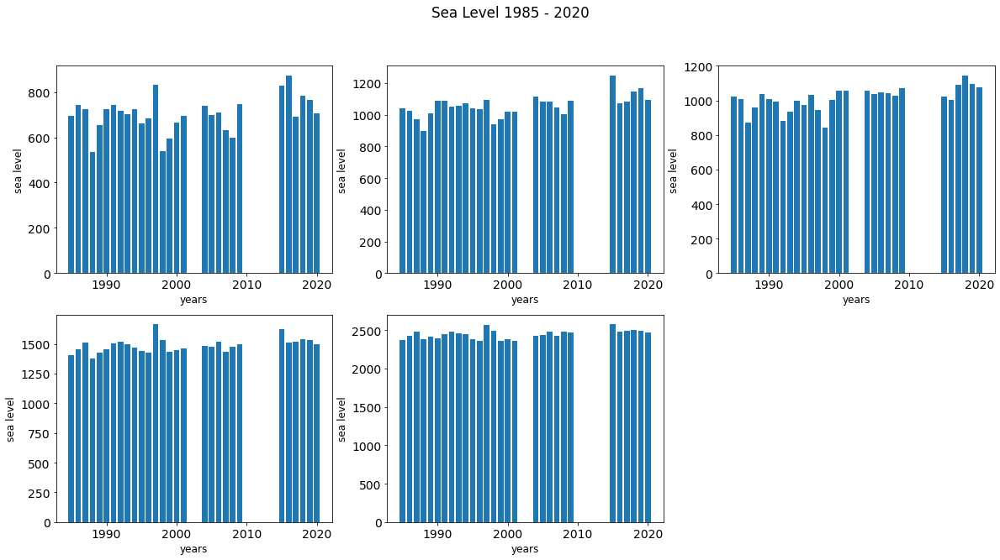

In [32]:
# Vista de nivel de mar anual por estacion

plt.figure(figsize=(20, 10))
plt.rcParams['font.size']='14'

plt.subplot(231)

plt.bar(df_p['Year'].values,df_p['d011'].values)
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)


plt.subplot(232)

plt.bar(df_p['Year'].values,df_p['d013'].values)
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(233)

plt.bar(df_p['Year'].values,df_p['d029'].values)
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(234)

plt.bar(df_p['Year'].values,df_p['d030'].values)
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(235)

plt.bar(df_p['Year'].values,df_p['d091'].values)
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.suptitle('Sea Level 1985 - 2020')
plt.show()

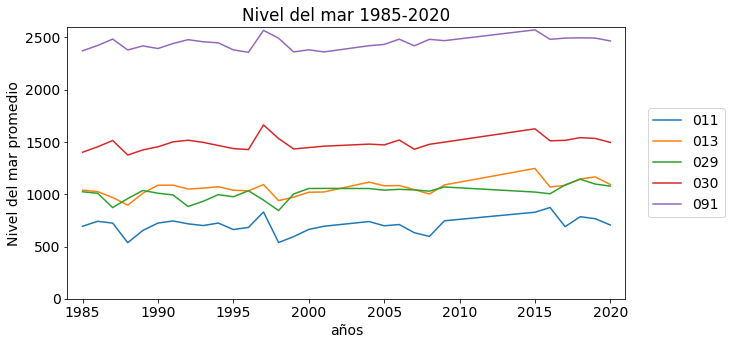

In [49]:
plt.figure(figsize=(10, 5))
plt.plot(df_p['Year'].values,df_p['d011'],label='011')
plt.plot(df_p['Year'].values,df_p['d013'], label='013')
plt.plot(df_p['Year'].values,df_p['d029'],label='029')
plt.plot(df_p['Year'].values,df_p['d030'],label='030')
plt.plot(df_p['Year'].values,df_p['d091'],label='091')

plt.legend(bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)

plt.ylabel('Nivel del mar promedio')
plt.xlabel('años')

plt.axis([1984, 2021,0,2600])

plt.title('Nivel del mar 1985-2020')
plt.show()

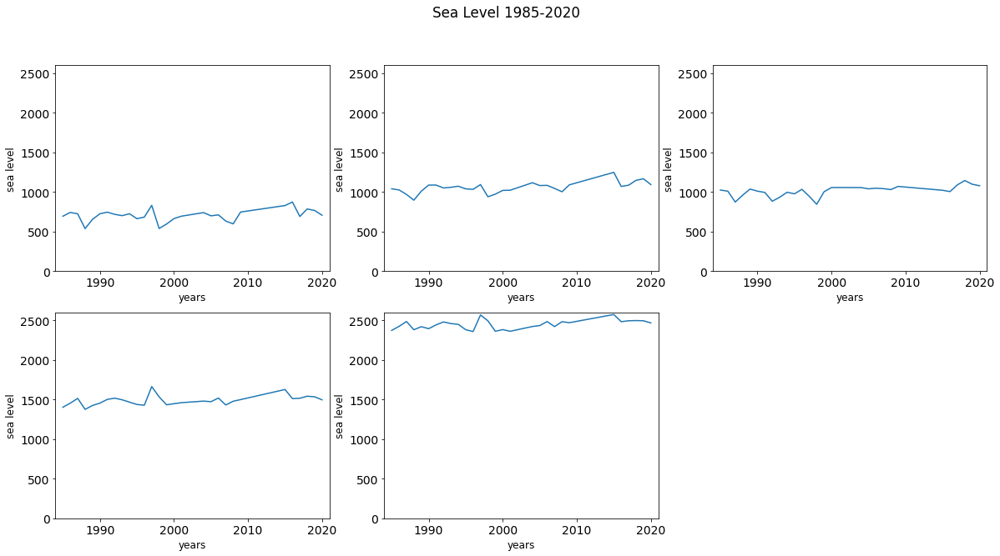

In [187]:
plt.figure(figsize=(20, 10))
plt.rcParams['font.size']='14'

plt.subplot(231)
plt.plot(df_p['Year'].values, df_p['d011'], label='011')
plt.axis([1984, 2021,0,2600])
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(232)
plt.plot(df_p['Year'].values, df_p['d013'], label='013')
plt.axis([1984, 2021,0,2600])
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)


plt.subplot(233)
plt.plot(df_p['Year'].values, df_p['d029'], label='029')
plt.axis([1984, 2021,0,2600])
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)
# 
plt.subplot(234)
plt.plot(df_p['Year'].values, df_p['d030'], label='030')
plt.axis([1984, 2021,0,2600])
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(235)
plt.plot(df_p['Year'].values, df_p['d091'], label='091')
plt.axis([1984, 2021,0,2600])
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)

#label the figure
plt.suptitle('Sea Level 1985-2020')
plt.show()

In [145]:
# df_70_84

# Dataframe 1970 - 1985

df_a=df_70_84
df_a = df_a[['Year','d011','d013', 'd029', 'd030', 'd091']].groupby('Year').mean()
df_a.reset_index(inplace=True)

# df_a['d011'] = df_a['d011'].fillna(0)
# df_a['d013'] = df_a['d013'].fillna(0)
# df_a['d029'] = df_a['d029'].fillna(0)
# df_a['d030'] = df_a['d030'].fillna(0)
# df_a['d091'] = df_a['d091'].fillna(0)

df_a['Year'] = df_a['Year'].astype(int)

df_a

,Year,d011,d013,d029,d030,d091
0,1970,NaN,NaN,NaN,NaN,2154.921283
1,1971,NaN,NaN,NaN,NaN,2171.073248
2,1972,NaN,1122.500000,NaN,NaN,2300.151335
3,1973,NaN,966.728045,NaN,NaN,2158.841096
4,1974,611.812883,1021.580822,NaN,NaN,2181.734072
5,1975,601.997199,999.323120,NaN,NaN,2165.216438
6,1976,718.896440,1074.276712,NaN,NaN,2267.166667
7,1977,672.189041,1062.955432,NaN,NaN,2201.897351
8,1978,696.056180,1043.383754,1048.350877,1434.410959,2218.233146
9,1979,691.850187,1048.071633,974.951070,1460.534247,2256.416438


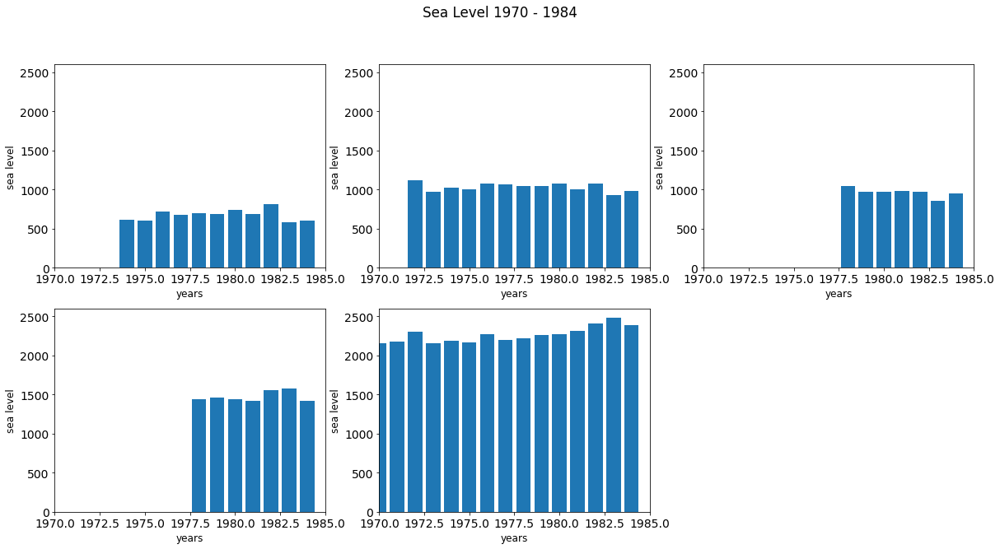

In [39]:
# Vista de nivel de mar anual por estacion

plt.figure(figsize=(20, 10))

plt.subplot(231)
plt.bar(df_a['Year'],df_a['d011'].values)
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)
plt.axis([1970, 1985,0,2600])

plt.subplot(232)
plt.bar(df_a['Year'],df_a['d013'].values)
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)
plt.axis([1970, 1985,0,2600])

plt.subplot(233)
plt.bar(df_a['Year'],df_a['d029'].values)
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)
plt.axis([1970, 1985,0,2600])

plt.subplot(234)
plt.bar(df_a['Year'],df_a['d030'].values)
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)
plt.axis([1970, 1985,0,2600])

plt.subplot(235)
plt.bar(df_a['Year'],df_a['d091'].values)
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)
plt.axis([1970, 1985,0,2600])

plt.suptitle('Sea Level 1970 - 1984')
plt.show()

In [40]:
df_a['Year'].describe()

count      15.000000
mean     1977.000000
std         4.472136
min      1970.000000
25%      1973.500000
50%      1977.000000
75%      1980.500000
max      1984.000000
Name: Year, dtype: float64

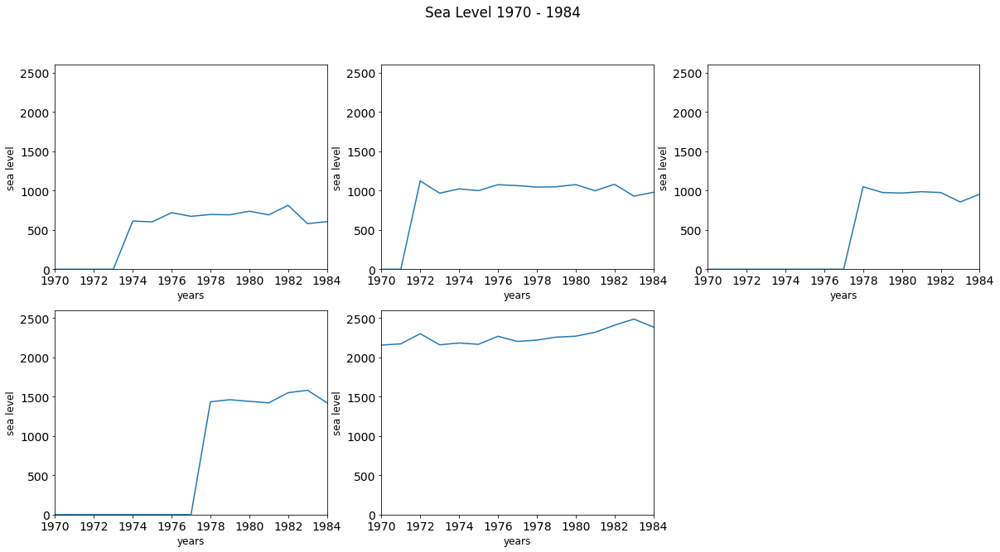

In [41]:
plt.figure(figsize=(20, 10))

plt.subplot(231)
plt.plot(df_a['Year'], df_a['d011'], label='011')
plt.axis([1970, 1984,0,2600])
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)


plt.subplot(232)
plt.plot(df_a['Year'], df_a['d013'], label='013')
plt.axis([1970, 1984,0,2600])
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)


plt.subplot(233)
plt.plot(df_a['Year'], df_a['d029'], label='029')
plt.axis([1970, 1984,0,2600])
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(234)
plt.plot(df_a['Year'], df_a['d030'], label='030')
plt.axis([1970, 1984,0,2600])
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(235)
plt.plot(df_a['Year'], df_a['d091'], label='091')
plt.axis([1970, 1984,0,2600])
plt.xlabel('years', fontsize=12)
plt.ylabel('sea level', fontsize=12)

#label the figure
plt.suptitle('Sea Level 1970 - 1984')
plt.show()

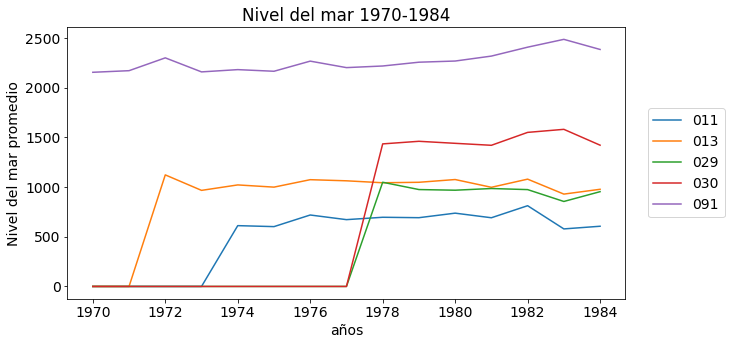

In [44]:
plt.figure(figsize=(10, 5))
plt.plot(df_a['Year'].values,df_a['d011'],label='011')
plt.plot(df_a['Year'].values,df_a['d013'], label='013')
plt.plot(df_a['Year'].values,df_a['d029'],label='029')
plt.plot(df_a['Year'].values,df_a['d030'],label='030')
plt.plot(df_a['Year'].values,df_a['d091'],label='091')

plt.legend(bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)

plt.ylabel('Nivel del mar promedio')
plt.xlabel('años')

plt.title('Nivel del mar 1970-1984')
plt.show()

In [195]:
df_a['Year'].describe()

count      15.000000
mean     1977.000000
std         4.472136
min      1970.000000
25%      1973.500000
50%      1977.000000
75%      1980.500000
max      1984.000000
Name: Year, dtype: float64

In [33]:
# Nivel del mar del año 2015

df_2015 = df_85_20.loc[df_85_20['Year'] == 2015]
df_2015 = df_2015[['Month','d011','d013', 'd029', 'd030', 'd091']].groupby('Month').mean()
df_2015.reset_index(inplace=True)

df_2015

,Month,d011,d013,d029,d030,d091
0,1,805.451613,1247.111111,1110.483871,1516.903226,2477.709677
1,2,815.785714,1247.111111,1138.035714,1514.678571,2459.392857
2,3,862.161290,1247.111111,1110.354839,1577.322581,2499.354839
3,4,841.900000,1247.111111,1052.000000,1692.300000,2629.066667
4,5,814.454839,1247.111111,1029.967742,1698.774194,2663.548387
5,6,828.100000,1247.111111,995.733333,1671.500000,2603.633333
6,7,828.100000,1240.917563,984.709677,1594.290323,2557.516129
7,8,828.100000,1238.516129,952.774194,1564.967742,2538.806452
8,9,828.100000,1273.900000,950.433333,1643.166667,2595.333333
9,10,828.100000,1286.709677,1004.354839,1599.677419,2561.064516


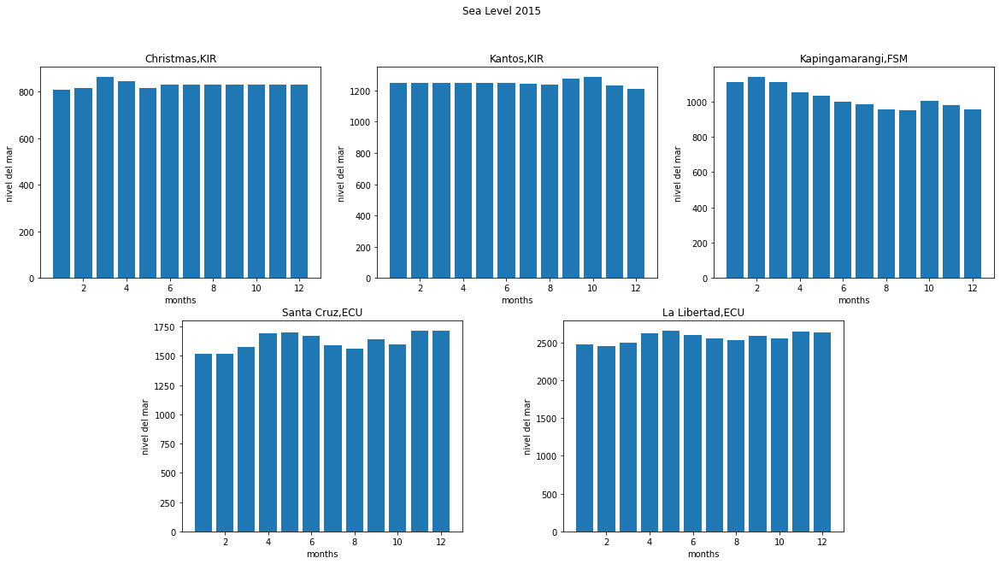

In [45]:
# Sea Level en el 2015
# plt.figure(figsize=(20, 10))

figs,axs = plt.subplots(2,3, figsize=(20, 10))


plt.rc('font', size=10) 

# axs[0, 0].subplot(231)
axs[0, 0].bar(df_2015['Month'].values,df_2015['d011'].values)
axs[0, 0].set(xlabel='months' ,ylabel='nivel del mar')
axs[0, 0].set_title('Christmas,KIR')
# plt.xlabel('months', fontsize=12)
# plt.ylabel('sea level', fontsize=12)

# plt.subplot(232)
axs[0, 1].bar(df_2015['Month'].values,df_2015['d013'].values)
axs[0, 1].set(xlabel='months' ,ylabel='nivel del mar')
axs[0, 1].set_title('Kantos,KIR')

# plt.xlabel('months', fontsize=12)
# plt.ylabel('sea level', fontsize=12)

# plt.subplot(233)
axs[0, 2].bar(df_2015['Month'].values,df_2015['d029'].values)
axs[0, 2].set(xlabel='months' ,ylabel='nivel del mar')
axs[0, 2].set_title('Kapingamarangi,FSM')

# axs[0, 2].xlabel('months', fontsize=12)
# axs[0, 2].ylabel('sea level', fontsize=12)

# plt.subplot(234)
axs[1, 0].bar(df_2015['Month'].values,df_2015['d030'].values)
axs[1, 0].set(xlabel='months' ,ylabel='nivel del mar')
axs[1, 0].set_position([0.24,0.125,0.228,0.343])

axs[1, 0].set_title('Santa Cruz,ECU')

# plt.xlabel('months', fontsize=12)
# plt.ylabel('sea level', fontsize=12)

# plt.subplot(235)
axs[1, 1].bar(df_2015['Month'].values,df_2015['d091'].values)
axs[1, 1].set(xlabel='months' ,ylabel='nivel del mar')
axs[1,1].set_position([0.55,0.125,0.228,0.343])

axs[1, 1].set_title('La Libertad,ECU')

axs[1, 2].set_visible(False)

# axs[1, 1].xlabel('months', fontsize=12)
# plt.ylabel('sea level', fontsize=12)

plt.suptitle('Sea Level 2015')
plt.show()

In [42]:
# Nivel del mar del año 1997

df_1997 = df_85_20.loc[df_85_20['Year'] == 1997]
df_1997 = df_1997[['Month','d011','d013', 'd029', 'd030', 'd091']].groupby('Month').mean()
df_1997.reset_index(inplace=True)

df_1997

,Month,d011,d013,d029,d030,d091
0,1,758.161290,1137.129032,1068.903226,1414.419355,2355.193548
1,2,709.107143,1106.678571,1123.785714,1551.392857,2458.821429
2,3,751.258065,1168.000000,1164.290323,1585.612903,2478.419355
3,4,788.400000,1099.333333,1051.600000,1593.433333,2469.166667
4,5,778.806452,1082.806452,960.709677,1734.838710,2642.129032
5,6,853.966667,1024.666667,912.666667,1702.100000,2605.600000
6,7,794.677419,1019.935484,953.774194,1728.129032,2619.709677
7,8,909.741935,1102.451613,916.806452,1599.000000,2497.290323
8,9,954.233333,1176.166667,820.933333,1614.633333,2507.733333
9,10,978.258065,1147.032258,825.838710,1750.921939,2659.483871


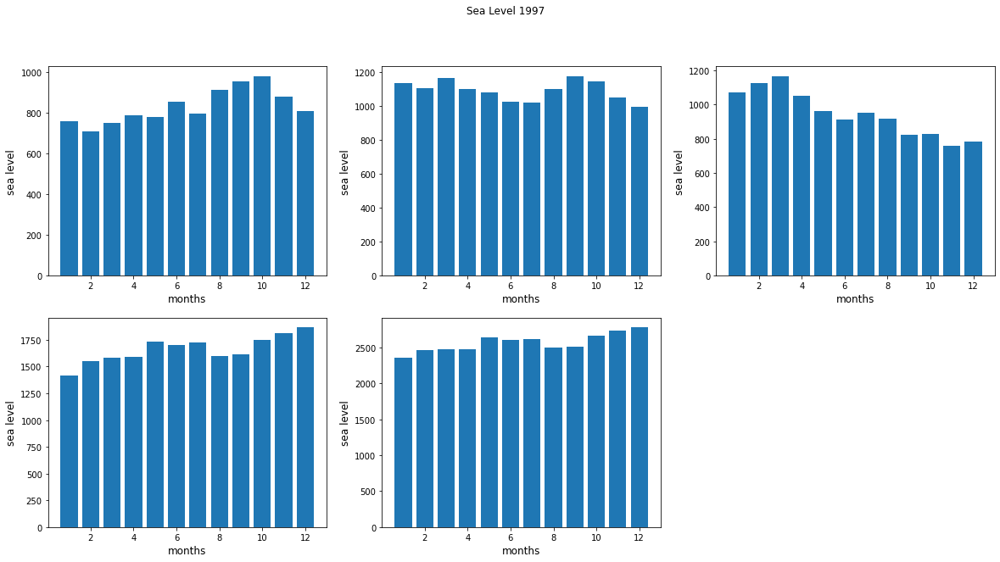

In [43]:
# Sea Level en el 2015
plt.figure(figsize=(20, 10))

plt.subplot(231)
plt.bar(df_1997['Month'].values,df_1997['d011'].values)
plt.xlabel('months', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(232)
plt.bar(df_1997['Month'].values,df_1997['d013'].values)
plt.xlabel('months', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(233)
plt.bar(df_1997['Month'].values,df_1997['d029'].values)
plt.xlabel('months', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(234)
plt.bar(df_1997['Month'].values,df_1997['d030'].values)
plt.xlabel('months', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(235)
plt.bar(df_1997['Month'].values,df_1997['d091'].values)
plt.xlabel('months', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.suptitle('Sea Level 1997')
plt.show()

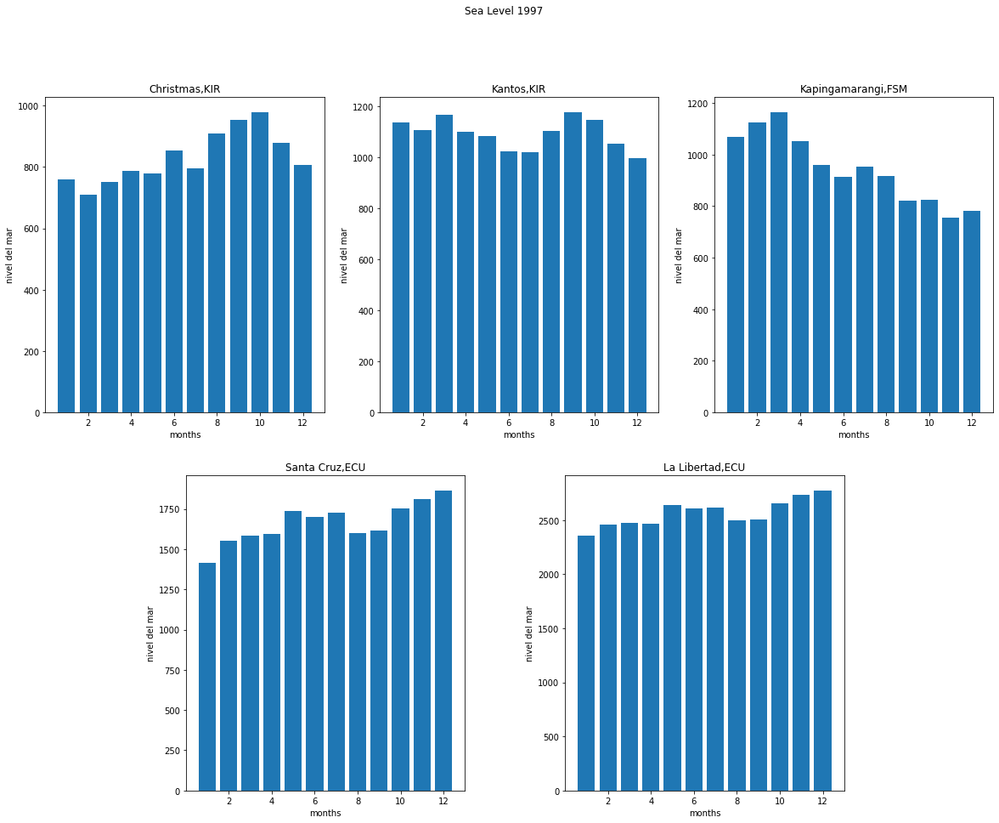

In [44]:
# Sea Level en el 2015
# plt.figure(figsize=(20, 10))

figs,axs = plt.subplots(2,3, figsize=(20, 15))


plt.rc('font', size=10) 

# axs[0, 0].subplot(231)
axs[0, 0].bar(df_1997['Month'].values,df_1997['d011'].values)
axs[0, 0].set(xlabel='months' ,ylabel='nivel del mar')
axs[0, 0].set_title('Christmas,KIR')
# plt.xlabel('months', fontsize=12)
# plt.ylabel('sea level', fontsize=12)

# plt.subplot(232)
axs[0, 1].bar(df_1997['Month'].values,df_1997['d013'].values)
axs[0, 1].set(xlabel='months' ,ylabel='nivel del mar')
axs[0, 1].set_title('Kantos,KIR')

# plt.xlabel('months', fontsize=12)
# plt.ylabel('sea level', fontsize=12)

# plt.subplot(233)
axs[0, 2].bar(df_1997['Month'].values,df_1997['d029'].values)
axs[0, 2].set(xlabel='months' ,ylabel='nivel del mar')
axs[0, 2].set_title('Kapingamarangi,FSM')

# axs[0, 2].xlabel('months', fontsize=12)
# axs[0, 2].ylabel('sea level', fontsize=12)

# plt.subplot(234)
axs[1, 0].bar(df_1997['Month'].values,df_1997['d030'].values)
axs[1, 0].set(xlabel='months' ,ylabel='nivel del mar')
axs[1, 0].set_position([0.24,0.125,0.228,0.343])

axs[1, 0].set_title('Santa Cruz,ECU')

# plt.xlabel('months', fontsize=12)
# plt.ylabel('sea level', fontsize=12)

# plt.subplot(235)
axs[1, 1].bar(df_1997['Month'].values,df_1997['d091'].values)
axs[1, 1].set(xlabel='months' ,ylabel='nivel del mar')
axs[1,1].set_position([0.55,0.125,0.228,0.343])

axs[1, 1].set_title('La Libertad,ECU')

axs[1, 2].set_visible(False)

# axs[1, 1].xlabel('months', fontsize=12)
# plt.ylabel('sea level', fontsize=12)

plt.suptitle('Sea Level 1997')
plt.show()

## Relacion entre temperatura y nivel del mar

In [47]:
# Temperatura de 2015

df_sst_011 = df_sst_2015.loc[ (df_sst_2015['latitude'] == 1.5 ) & ( df_sst_2015['longitude'] == -157.5 ) ]
df_sst_013 = df_sst_2015.loc[ (df_sst_2015['latitude'] == -2.5 ) & ( df_sst_2015['longitude'] == -171.5 ) ]
df_sst_029 = df_sst_2015.loc[ (df_sst_2015['latitude'] == 1.5 ) & ( df_sst_2015['longitude'] == -154.5 ) ]
df_sst_030 = df_sst_2015.loc[ (df_sst_2015['latitude'] == -0.5 ) & ( df_sst_2015['longitude'] == -90.5 ) ]
df_sst_091 = df_sst_2015.loc[ (df_sst_2015['latitude'] == -2.5 ) & ( df_sst_2015['longitude'] == -80.5 ) ]


df_sst_011.reset_index(inplace=True, drop=True)
df_sst_011 = df_sst_011.drop([12]) #Ultima fila corresponde a enero del siguiente año

df_sst_013.reset_index(inplace=True, drop=True)
df_sst_013 = df_sst_013.drop([12])

df_sst_029.reset_index(inplace=True, drop=True)
df_sst_029 = df_sst_029.drop([12])

df_sst_030.reset_index(inplace=True, drop=True)
df_sst_030 = df_sst_030.drop([12])

df_sst_091.reset_index(inplace=True, drop=True)
df_sst_091 = df_sst_091.drop([12])


In [47]:
df_sst_091


,time,latitude,longitude,sst
0,2015-01-16 12:00:00+00:00,-2.5,-80.5,24.455790
1,2015-02-16 12:00:00+00:00,-2.5,-80.5,24.594055
2,2015-03-16 12:00:00+00:00,-2.5,-80.5,25.450155
3,2015-04-16 12:00:00+00:00,-2.5,-80.5,25.281470
4,2015-05-16 12:00:00+00:00,-2.5,-80.5,26.030365
5,2015-06-16 12:00:00+00:00,-2.5,-80.5,24.727120
6,2015-07-16 12:00:00+00:00,-2.5,-80.5,24.969143
7,2015-08-16 12:00:00+00:00,-2.5,-80.5,23.616226
8,2015-09-16 12:00:00+00:00,-2.5,-80.5,24.494907
9,2015-10-16 12:00:00+00:00,-2.5,-80.5,24.545530


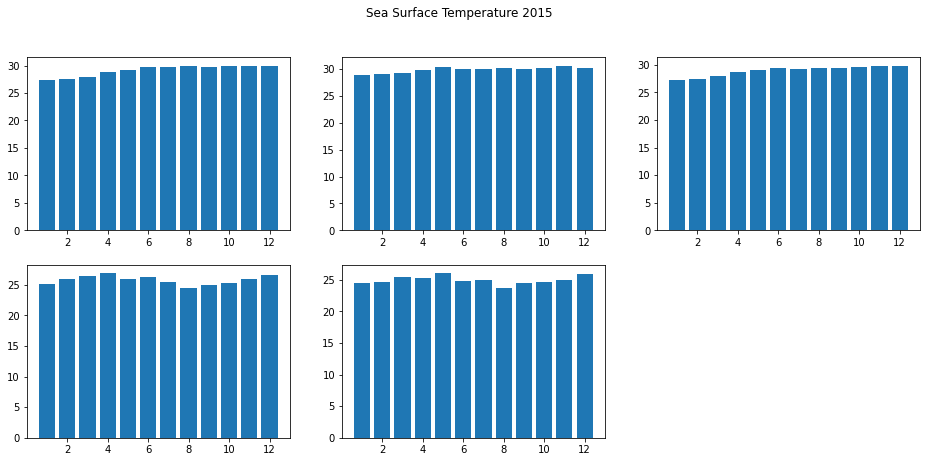

In [127]:

plt.figure(figsize=(16, 7))

plt.subplot(231)
plt.bar(df_sst_011['time'].dt.month.values ,df_sst_011['sst'])


plt.subplot(232)
plt.bar(df_sst_013['time'].dt.month.values ,df_sst_013['sst'])

plt.subplot(233)
plt.bar(df_sst_029['time'].dt.month.values ,df_sst_029['sst'])

plt.subplot(234)
plt.bar(df_sst_030['time'].dt.month.values ,df_sst_030['sst'])

plt.subplot(235)
plt.bar(df_sst_091['time'].dt.month.values ,df_sst_091['sst'])

plt.suptitle('Sea Surface Temperature 2015')
plt.show()

plt.show()

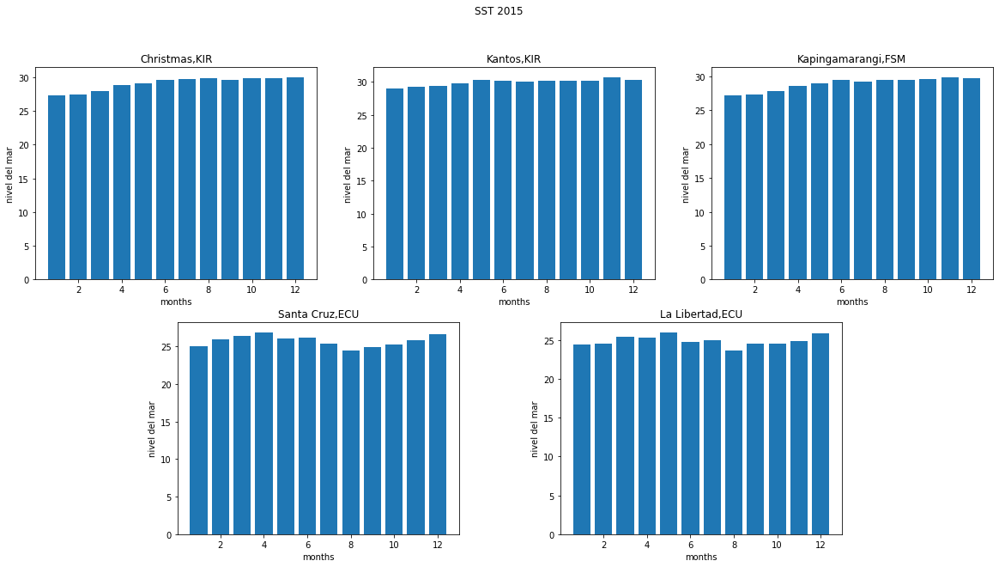

In [49]:
# Sea Level en el 2015
# plt.figure(figsize=(20, 10))

figs,axs = plt.subplots(2,3, figsize=(20, 10))


plt.rc('font', size=10) 

# axs[0, 0].subplot(231)
axs[0, 0].bar(df_sst_011['time'].dt.month.values ,df_sst_011['sst'])
axs[0, 0].set(xlabel='months' ,ylabel='nivel del mar')
axs[0, 0].set_title('Christmas,KIR')
# plt.xlabel('months', fontsize=12)
# plt.ylabel('sea level', fontsize=12)

# plt.subplot(232)
axs[0, 1].bar(df_sst_013['time'].dt.month.values ,df_sst_013['sst'])
axs[0, 1].set(xlabel='months' ,ylabel='nivel del mar')
axs[0, 1].set_title('Kantos,KIR')

# plt.xlabel('months', fontsize=12)
# plt.ylabel('sea level', fontsize=12)

# plt.subplot(233)
axs[0, 2].bar(df_sst_029['time'].dt.month.values ,df_sst_029['sst'])
axs[0, 2].set(xlabel='months' ,ylabel='nivel del mar')
axs[0, 2].set_title('Kapingamarangi,FSM')

# axs[0, 2].xlabel('months', fontsize=12)
# axs[0, 2].ylabel('sea level', fontsize=12)

# plt.subplot(234)
axs[1, 0].bar(df_sst_030['time'].dt.month.values ,df_sst_030['sst'])
axs[1, 0].set(xlabel='months' ,ylabel='nivel del mar')
axs[1, 0].set_position([0.24,0.125,0.228,0.343])

axs[1, 0].set_title('Santa Cruz,ECU')

# plt.xlabel('months', fontsize=12)
# plt.ylabel('sea level', fontsize=12)

# plt.subplot(235)
axs[1, 1].bar(df_sst_091['time'].dt.month.values ,df_sst_091['sst'])
axs[1, 1].set(xlabel='months' ,ylabel='nivel del mar')
axs[1,1].set_position([0.55,0.125,0.228,0.343])

axs[1, 1].set_title('La Libertad,ECU')

axs[1, 2].set_visible(False)

# axs[1, 1].xlabel('months', fontsize=12)
# plt.ylabel('sea level', fontsize=12)

plt.suptitle('SST 2015')
plt.show()

In [48]:
# sst de todas las estaciones merge
df_sst_all = df_sst_011.drop(['latitude','longitude'], axis=1)
df_sst_all.rename(columns={'sst':'Christmas,KIR'}, inplace=True)

df_sst_all = df_sst_all.merge(df_sst_013.drop(['latitude','longitude'], axis=1), how='left', on='time')
df_sst_all.rename(columns={'sst':'Kantos,KIR'}, inplace=True)

df_sst_all = df_sst_all.merge(df_sst_029.drop(['latitude','longitude'], axis=1), how='left', on='time')
df_sst_all.rename(columns={'sst':'Kapingamarangi,FSM'}, inplace=True)

df_sst_all = df_sst_all.merge(df_sst_030.drop(['latitude','longitude'], axis=1), how='left', on='time')
df_sst_all.rename(columns={'sst':'Santa Cruz,ECU'}, inplace=True)

df_sst_all = df_sst_all.merge(df_sst_091.drop(['latitude','longitude'], axis=1), how='left', on='time')
df_sst_all.rename(columns={'sst':'La Libertad,ECU'}, inplace=True)

#  'd030':'Santa Cruz,ECU', 'd091':'La Libertad,ECU'}, inplace=True )
df_sst_all

,time,"Christmas,KIR","Kantos,KIR","Kapingamarangi,FSM","Santa Cruz,ECU","La Libertad,ECU"
0,2015-01-16 12:00:00+00:00,27.275763,28.958126,27.245304,25.032600,24.455790
1,2015-02-16 12:00:00+00:00,27.460655,29.172977,27.400974,25.987606,24.594055
2,2015-03-16 12:00:00+00:00,27.993480,29.374031,27.914528,26.335114,25.450155
3,2015-04-16 12:00:00+00:00,28.795780,29.771212,28.637558,26.894300,25.281470
4,2015-05-16 12:00:00+00:00,29.101028,30.331665,29.038520,25.998580,26.030365
5,2015-06-16 12:00:00+00:00,29.656845,30.096466,29.484838,26.177563,24.727120
6,2015-07-16 12:00:00+00:00,29.741722,30.083675,29.305770,25.367010,24.969143
7,2015-08-16 12:00:00+00:00,29.923065,30.136295,29.465961,24.421078,23.616226
8,2015-09-16 12:00:00+00:00,29.659832,30.110773,29.518032,24.870756,24.494907
9,2015-10-16 12:00:00+00:00,29.828074,30.170546,29.618881,25.302690,24.545530


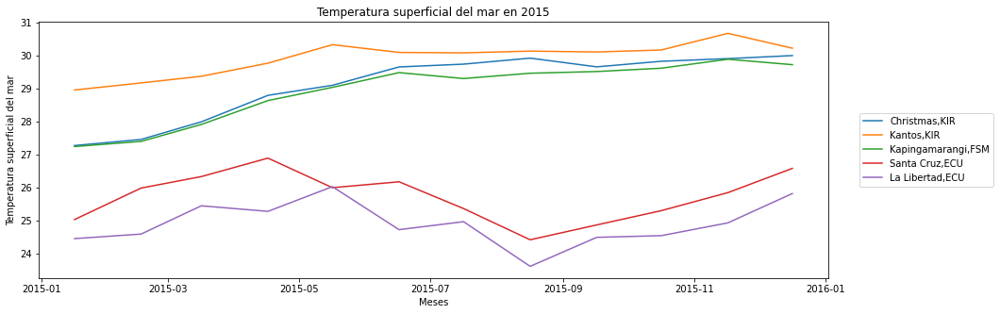

In [49]:
plt.figure(figsize=(15, 5))
plt.plot(df_sst_all['time'].values,df_sst_all['Christmas,KIR'], label='Christmas,KIR')
plt.plot(df_sst_all['time'].values,df_sst_all['Kantos,KIR'], label='Kantos,KIR')
plt.plot(df_sst_all['time'].values,df_sst_all['Kapingamarangi,FSM'], label='Kapingamarangi,FSM')
plt.plot(df_sst_all['time'].values,df_sst_all['Santa Cruz,ECU'], label='Santa Cruz,ECU')
plt.plot(df_sst_all['time'].values,df_sst_all['La Libertad,ECU'] , label='La Libertad,ECU')

plt.legend(bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)

plt.ylabel('Temperatura superficial del mar')
plt.xlabel('Meses')

plt.title('Temperatura superficial del mar en 2015')
plt.show()

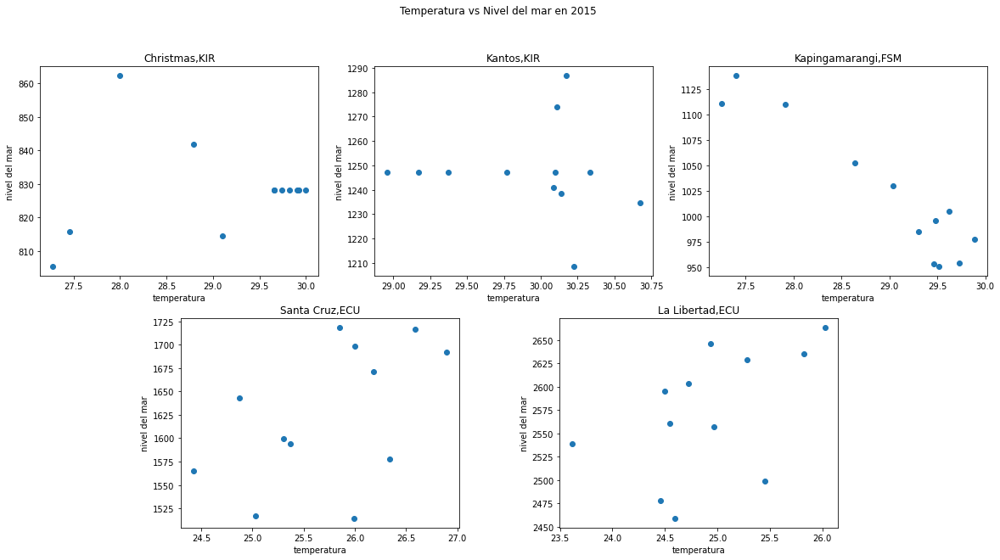

In [95]:
figs,axs = plt.subplots(2,3, figsize=(20, 10))

# plt.figure(figsize=(20, 10))

# plt.subplot(231)
axs[0, 0].scatter(df_sst_011['sst'], df_2015['d011'])
# plt.axis([1970, 1984,0,2600])
# axs[0, 0].set(ylabel='nivel del mar',)

axs[0, 0].set(xlabel='temperatura' ,ylabel='nivel del mar',)
axs[0, 0].set_title('Christmas,KIR')

# plt.subplot(232)
axs[0, 1].scatter(df_sst_013['sst'], df_2015['d013'])
# plt.axis([1970, 1984,0,2600])
axs[0, 1].set(xlabel='temperatura' ,ylabel='nivel del mar',)

axs[0, 1].set( ylabel='nivel del mar',)
axs[0, 1].set_title('Kantos,KIR')


# plt.subplot(233)
axs[0, 2].scatter(df_sst_029['sst'], df_2015['d029'])
# plt.axis([1970, 1984,0,2600])
axs[0, 2].set(xlabel='temperatura' ,ylabel='nivel del mar',)
axs[0, 2].set_title('Kapingamarangi,FSM')

# plt.subplot(234)
axs[1, 0].scatter(df_sst_030['sst'], df_2015['d030'])
# plt.axis([1970, 1984,0,2600])
axs[1, 0].set(xlabel='temperatura' ,ylabel='nivel del mar',)
axs[1, 0].set_position([0.24,0.125,0.228,0.343])
axs[1, 0].set_title('Santa Cruz,ECU')

# plt.subplot(235)
axs[1, 1].scatter(df_sst_091['sst'], df_2015['d091'])
# plt.axis([1970, 1984,0,2600])
axs[1, 1].set(xlabel='temperatura' ,ylabel='nivel del mar',)
axs[1,1].set_position([0.55,0.125,0.228,0.343])
axs[1, 1].set_title('La Libertad,ECU')

axs[1, 2].set_visible(False)

#label the figure
plt.suptitle('Temperatura vs Nivel del mar en 2015')
plt.show()

In [77]:
temperatura_15 = []
dataset_temp_15=[df_sst_011,df_sst_013,df_sst_029,df_sst_030,df_sst_091]

for d in dataset_temp_15:
    d = d['sst'].values
    for v in d:
        temperatura_15.append(v)
  

deep_15 = []
dataset_deep_15=['d011','d013','d029','d030','d091']

for d in dataset_deep_15:
    d = df_2015[d].values
    for v in d:
        deep_15.append(v)

    
# temperatura_15
# deep_15

[805.4516129032259,
 815.7857142857143,
 862.1612903225806,
 841.9,
 814.4548387096773,
 828.0999999999997,
 828.0999999999996,
 828.0999999999996,
 828.0999999999997,
 828.0999999999996,
 828.0999999999997,
 828.0999999999996,
 1247.1111111111102,
 1247.1111111111102,
 1247.1111111111102,
 1247.1111111111102,
 1247.1111111111102,
 1247.1111111111102,
 1240.9175627240138,
 1238.516129032258,
 1273.9,
 1286.7096774193549,
 1234.5333333333333,
 1208.5483870967741,
 1110.483870967742,
 1138.0357142857142,
 1110.3548387096773,
 1052.0,
 1029.967741935484,
 995.7333333333333,
 984.7096774193549,
 952.7741935483871,
 950.4333333333333,
 1004.3548387096774,
 977.6,
 953.5483870967741,
 1516.9032258064517,
 1514.6785714285713,
 1577.3225806451612,
 1692.3,
 1698.774193548387,
 1671.5,
 1594.2903225806451,
 1564.967741935484,
 1643.1666666666667,
 1599.6774193548388,
 1718.2333333333333,
 1716.4516129032259,
 2477.7096774193546,
 2459.3928571428573,
 2499.3548387096776,
 2629.0666666666666,
 26

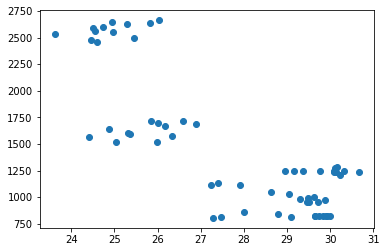

In [78]:
plt.scatter(temperatura_15,deep_15)

In [20]:
# Temperatura de 1997

df_sst_97_011 = df_sst_1997.loc[ (df_sst_1997['latitude'] == 1.5 ) & ( df_sst_1997['longitude'] == -157.5 ) ]
df_sst_97_013 = df_sst_1997.loc[ (df_sst_1997['latitude'] == -2.5 ) & ( df_sst_1997['longitude'] == -171.5 ) ]
df_sst_97_029 = df_sst_1997.loc[ (df_sst_1997['latitude'] == 1.5 ) & ( df_sst_1997['longitude'] == -154.5 ) ]
df_sst_97_030 = df_sst_1997.loc[ (df_sst_1997['latitude'] == -0.5 ) & ( df_sst_1997['longitude'] == -90.5 ) ]
df_sst_97_091 = df_sst_1997.loc[ (df_sst_1997['latitude'] == -2.5 ) & ( df_sst_1997['longitude'] == -80.5 ) ]


df_sst_97_011.reset_index(inplace=True, drop=True)
df_sst_97_011 = df_sst_97_011.drop([12]) #Ultima fila corresponde a enero del siguiente año

df_sst_97_013.reset_index(inplace=True, drop=True)
df_sst_97_013 = df_sst_97_013.drop([12])

df_sst_97_029.reset_index(inplace=True, drop=True)
df_sst_97_029 = df_sst_97_029.drop([12])

df_sst_97_030.reset_index(inplace=True, drop=True)
df_sst_97_030 = df_sst_97_030.drop([12])

df_sst_97_091.reset_index(inplace=True, drop=True)
df_sst_97_091 = df_sst_97_091.drop([12])


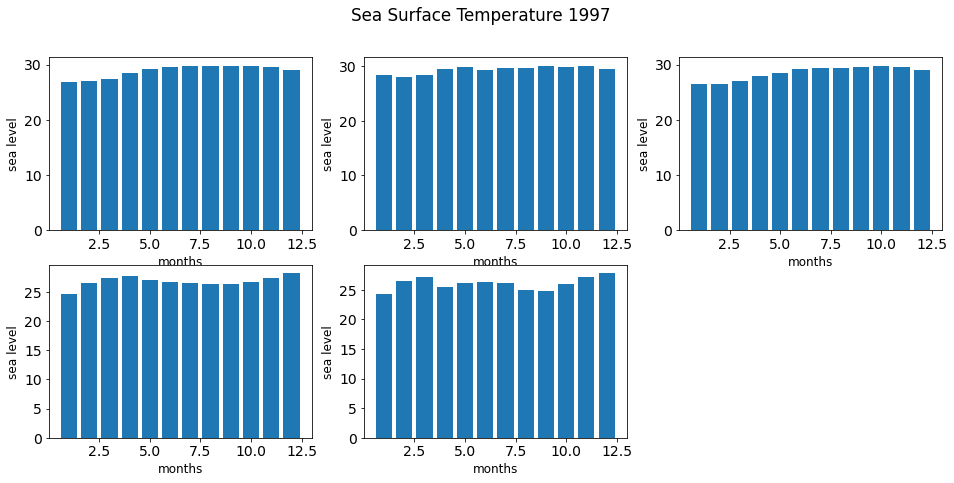

In [225]:

plt.figure(figsize=(16, 7))

plt.subplot(231)
plt.bar(df_sst_97_011['time'].dt.month.values ,df_sst_97_011['sst'])
plt.xlabel('months', fontsize=12)
plt.ylabel('sea level', fontsize=12)


plt.subplot(232)
plt.bar(df_sst_97_013['time'].dt.month.values ,df_sst_97_013['sst'])
plt.xlabel('months', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(233)
plt.bar(df_sst_97_029['time'].dt.month.values ,df_sst_97_029['sst'])
plt.xlabel('months', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(234)
plt.bar(df_sst_97_030['time'].dt.month.values ,df_sst_97_030['sst'])
plt.xlabel('months', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.subplot(235)
plt.bar(df_sst_97_091['time'].dt.month.values ,df_sst_97_091['sst'])
plt.xlabel('months', fontsize=12)
plt.ylabel('sea level', fontsize=12)

plt.suptitle('Sea Surface Temperature 1997')
plt.show()


In [37]:
# sst de todas las estaciones merge
df_sst_alld = df_sst_97_011.drop(['latitude','longitude'], axis=1)
df_sst_alld.rename(columns={'sst':'Christmas,KIR'}, inplace=True)

df_sst_alld = df_sst_alld.merge(df_sst_97_013.drop(['latitude','longitude'], axis=1), how='left', on='time')
df_sst_alld.rename(columns={'sst':'Kantos,KIR'}, inplace=True)

df_sst_alld = df_sst_alld.merge(df_sst_97_029.drop(['latitude','longitude'], axis=1), how='left', on='time')
df_sst_alld.rename(columns={'sst':'Kapingamarangi,FSM'}, inplace=True)

df_sst_alld = df_sst_alld.merge(df_sst_97_030.drop(['latitude','longitude'], axis=1), how='left', on='time')
df_sst_alld.rename(columns={'sst':'Santa Cruz,ECU'}, inplace=True)

df_sst_alld = df_sst_alld.merge(df_sst_97_091.drop(['latitude','longitude'], axis=1), how='left', on='time')
df_sst_alld.rename(columns={'sst':'La Libertad,ECU'}, inplace=True)

#  'd030':'Santa Cruz,ECU', 'd091':'La Libertad,ECU'}, inplace=True )
df_sst_alld

,time,"Christmas,KIR","Kantos,KIR","Kapingamarangi,FSM","Santa Cruz,ECU","La Libertad,ECU"
0,1997-01-16 12:00:00+00:00,26.813667,28.255495,26.552890,24.606186,24.231915
1,1997-02-15 00:00:00+00:00,27.029800,28.011750,26.449902,26.458984,26.489738
2,1997-03-16 12:00:00+00:00,27.459625,28.298763,27.036674,27.459394,27.198090
3,1997-04-16 00:00:00+00:00,28.454487,29.371656,27.976254,27.704266,25.411919
4,1997-05-16 12:00:00+00:00,29.127172,29.882767,28.549866,27.082680,26.162170
5,1997-06-16 00:00:00+00:00,29.485231,29.291527,29.206852,26.774883,26.349800
6,1997-07-16 12:00:00+00:00,29.779423,29.681946,29.393757,26.517973,26.111547
7,1997-08-16 12:00:00+00:00,29.835783,29.679075,29.411564,26.284363,24.882360
8,1997-09-16 00:00:00+00:00,29.751915,29.935379,29.509218,26.397331,24.756624
9,1997-10-16 12:00:00+00:00,29.769382,29.813318,29.838255,26.684086,25.994587


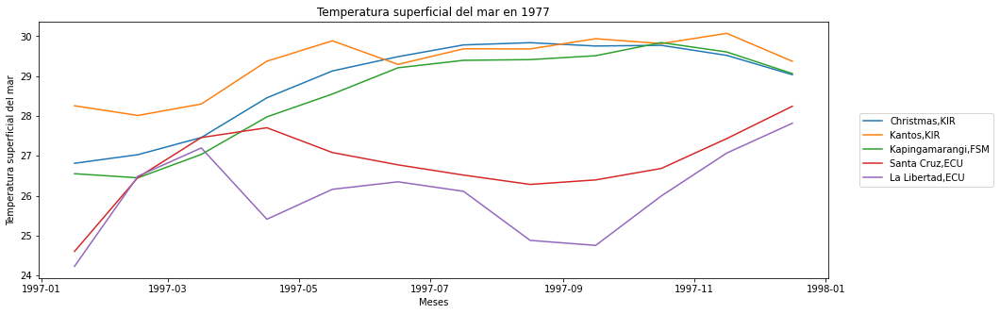

In [42]:
plt.figure(figsize=(15, 5))
plt.plot(df_sst_alld['time'].values,df_sst_alld['Christmas,KIR'], label='Christmas,KIR')
plt.plot(df_sst_alld['time'].values,df_sst_alld['Kantos,KIR'], label='Kantos,KIR')
plt.plot(df_sst_alld['time'].values,df_sst_alld['Kapingamarangi,FSM'], label='Kapingamarangi,FSM')
plt.plot(df_sst_alld['time'].values,df_sst_alld['Santa Cruz,ECU'], label='Santa Cruz,ECU')
plt.plot(df_sst_alld['time'].values,df_sst_alld['La Libertad,ECU'] , label='La Libertad,ECU')

plt.legend(bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)

plt.ylabel('Temperatura superficial del mar')
plt.xlabel('Meses')

plt.title('Temperatura superficial del mar en 1977')
plt.show()

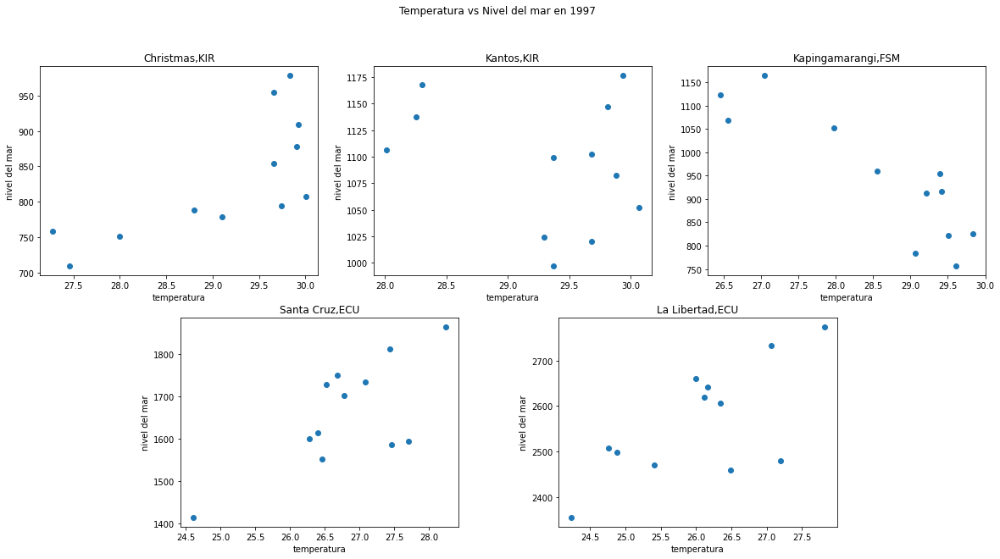

In [112]:
figs,axs = plt.subplots(2,3, figsize=(20, 10))

# plt.figure(figsize=(20, 10))

# plt.subplot(231)
axs[0, 0].scatter(df_sst_011['sst'], df_1997['d011'])
# plt.axis([1970, 1984,0,2600])
# axs[0, 0].set(ylabel='nivel del mar',)

axs[0, 0].set(xlabel='temperatura' ,ylabel='nivel del mar',)
axs[0, 0].set_title('Christmas,KIR')

# plt.subplot(232)
axs[0, 1].scatter(df_sst_97_013['sst'], df_1997['d013'])
# plt.axis([1970, 1984,0,2600])
axs[0, 1].set(xlabel='temperatura' ,ylabel='nivel del mar',)

axs[0, 1].set( ylabel='nivel del mar',)
axs[0, 1].set_title('Kantos,KIR')


# plt.subplot(233)
axs[0, 2].scatter(df_sst_97_029['sst'], df_1997['d029'])
# plt.axis([1970, 1984,0,2600])
axs[0, 2].set(xlabel='temperatura' ,ylabel='nivel del mar',)
axs[0, 2].set_title('Kapingamarangi,FSM')

# plt.subplot(234)
axs[1, 0].scatter(df_sst_97_030['sst'], df_1997['d030'])
# plt.axis([1970, 1984,0,2600])
axs[1, 0].set(xlabel='temperatura' ,ylabel='nivel del mar',)
axs[1, 0].set_position([0.24,0.125,0.228,0.343])
axs[1, 0].set_title('Santa Cruz,ECU')

# plt.subplot(235)
axs[1, 1].scatter(df_sst_97_091['sst'], df_1997['d091'])
# plt.axis([1970, 1984,0,2600])
axs[1, 1].set(xlabel='temperatura' ,ylabel='nivel del mar',)
axs[1,1].set_position([0.55,0.125,0.228,0.343])
axs[1, 1].set_title('La Libertad,ECU')

axs[1, 2].set_visible(False)

#label the figure
plt.suptitle('Temperatura vs Nivel del mar en 1997')
plt.show()

In [50]:
df_sst_alld.describe()

,"Christmas,KIR","Kantos,KIR","Kapingamarangi,FSM","Santa Cruz,ECU","La Libertad,ECU"
count,12.000000,12.000000,12.000000,12.000000,12.000000
mean,28.838070,29.305084,28.549116,26.803897,26.039710
std,1.128186,0.716803,1.237790,0.917860,1.067380
min,26.813667,28.011750,26.449902,24.606186,24.231915
25%,28.205772,29.043336,27.741359,26.443571,25.279529
50%,29.306202,29.525365,29.134140,26.729484,26.136859
75%,29.756282,29.830680,29.435977,27.439846,26.635039
max,29.835783,30.069866,29.838255,28.243284,27.816822


In [55]:
df_sst_all.set_index('time').idxmax(axis=1)


time
2015-01-16 12:00:00+00:00    Kantos,KIR
2015-02-16 12:00:00+00:00    Kantos,KIR
2015-03-16 12:00:00+00:00    Kantos,KIR
2015-04-16 12:00:00+00:00    Kantos,KIR
2015-05-16 12:00:00+00:00    Kantos,KIR
2015-06-16 12:00:00+00:00    Kantos,KIR
2015-07-16 12:00:00+00:00    Kantos,KIR
2015-08-16 12:00:00+00:00    Kantos,KIR
2015-09-16 12:00:00+00:00    Kantos,KIR
2015-10-16 12:00:00+00:00    Kantos,KIR
2015-11-16 12:00:00+00:00    Kantos,KIR
2015-12-16 12:00:00+00:00    Kantos,KIR
dtype: object

In [54]:
# Valores 1997
df_sst_alld.set_index('time').idxmax(axis=1)
# df_sst_alld

time
1997-01-16 12:00:00+00:00            Kantos,KIR
1997-02-15 00:00:00+00:00            Kantos,KIR
1997-03-16 12:00:00+00:00            Kantos,KIR
1997-04-16 00:00:00+00:00            Kantos,KIR
1997-05-16 12:00:00+00:00            Kantos,KIR
1997-06-16 00:00:00+00:00         Christmas,KIR
1997-07-16 12:00:00+00:00         Christmas,KIR
1997-08-16 12:00:00+00:00         Christmas,KIR
1997-09-16 00:00:00+00:00            Kantos,KIR
1997-10-16 12:00:00+00:00    Kapingamarangi,FSM
1997-11-16 00:00:00+00:00            Kantos,KIR
1997-12-16 12:00:00+00:00            Kantos,KIR
dtype: object

In [ ]:
# data = df_anio_p.astype(np.float)

# fig1, ax1 = plt.subplots()
# ax1.set_title('Basic Plot')
# ax1.boxplot(data)

# plt.show()

plt.figure(figsize=(10, 5))

df_anio_p.boxplot(grid=False)

plt.title('Nivel del Mar por estacion 1985 - 2020')

# plt.xticks()

# plt.xlabel('Estaciones')
plt.ylabel('Nivel del mar')

plt.show()

13509


Text(0.5, 0.98, 'Corrientes marinas con su temperatura en 1970-05-15')

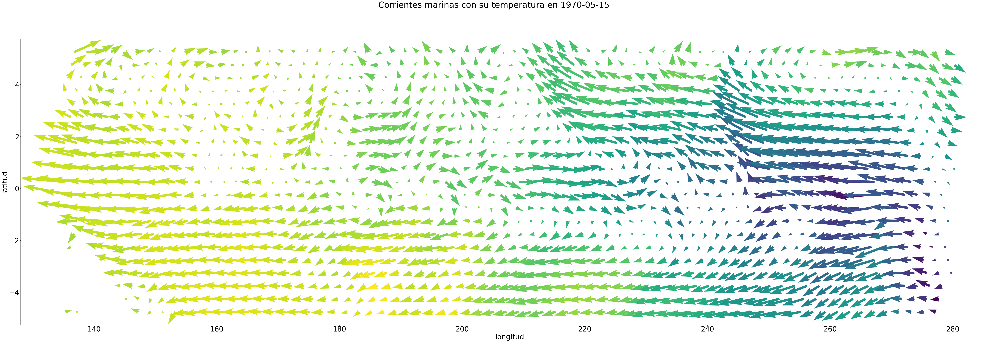

In [10]:

date = "1970-05-15"
df_previo['time'] = pd.to_datetime(df_previo['time (UTC)'], format="%Y-%m-%dT00:00:00Z")
df2=df_previo.where(df_previo['time'] == date).dropna().iloc[::4, :]

print(df2.size)
plt.figure(figsize=(100, 30))
plt.rcParams['font.size']='40'
plt.quiver(df2['longitude (degrees_east)'], df2['latitude (degrees_north)'], df2['u (m s-1)'], df2['v (m s-1)'], df2['temp (degree_C)'], linewidths=0.01)
plt.xlabel('longitud', fontsize=40)
plt.ylabel('latitud', fontsize=40)
plt.suptitle('Corrientes marinas con su temperatura en 1970-05-15')

13509


Text(0.5, 0.98, 'Corrientes marinas con su temperatura en 1970-08-15')

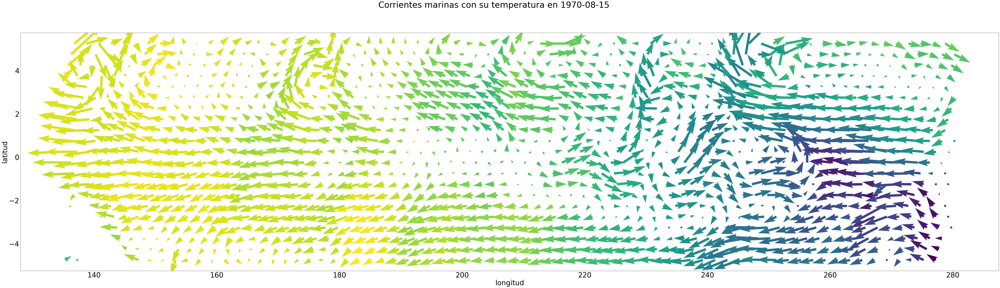

In [20]:

date = "1970-08-15"
df_previo['time'] = pd.to_datetime(df_previo['time (UTC)'], format="%Y-%m-%dT00:00:00Z")
df2=df_previo.where(df_previo['time'] == date).dropna().iloc[::4, :]

print(df2.size)
plt.figure(figsize=(100, 25))
plt.rcParams['font.size']='40'
plt.quiver(df2['longitude (degrees_east)'], df2['latitude (degrees_north)'], df2['u (m s-1)'], df2['v (m s-1)'], df2['temp (degree_C)'], linewidths=0.01)
plt.xlabel('longitud', fontsize=40)
plt.ylabel('latitud', fontsize=40)
plt.suptitle('Corrientes marinas con su temperatura en 1970-08-15')

13509


Text(0.5, 0.98, 'Corrientes marinas con su temperatura en 1970-11-15')

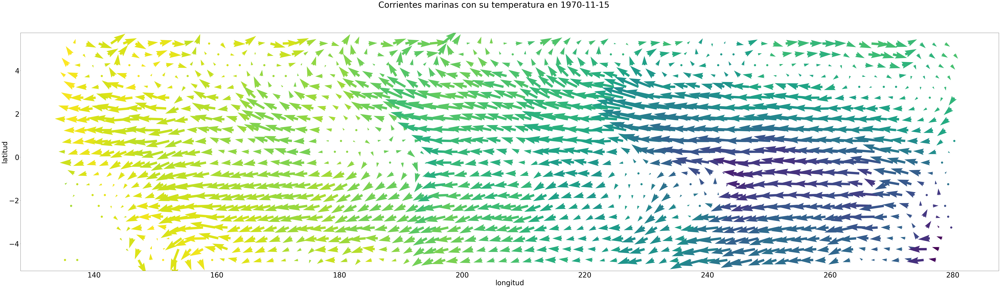

In [22]:

date = "1970-11-15"
df_previo['time'] = pd.to_datetime(df_previo['time (UTC)'], format="%Y-%m-%dT00:00:00Z")
df2=df_previo.where(df_previo['time'] == date).dropna().iloc[::4, :]

print(df2.size)
plt.figure(figsize=(100, 25))
plt.rcParams['font.size']='40'
plt.quiver(df2['longitude (degrees_east)'], df2['latitude (degrees_north)'], df2['u (m s-1)'], df2['v (m s-1)'], df2['temp (degree_C)'], linewidths=0.01)
plt.xlabel('longitud', fontsize=40)
plt.ylabel('latitud', fontsize=40)
plt.suptitle('Corrientes marinas con su temperatura en 1970-11-15')

In [13]:
df_actual

,time (UTC),depth (m),latitude (degrees_north),longitude (degrees_east),temp (degree_C),salt (PSU),u (m s-1),v (m s-1),time
0,1984-01-15T00:00:00Z,5.01,-4.75,135.25,29.562305,34.071102,-0.263516,0.037770,1970-01-15
1,1984-01-15T00:00:00Z,5.01,-4.75,135.75,29.568815,34.054290,-0.134401,0.084723,1970-01-15
2,1984-01-15T00:00:00Z,5.01,-4.75,136.25,29.559784,34.039494,-0.001687,0.000681,1970-01-15
3,1984-01-15T00:00:00Z,5.01,-4.75,136.75,29.567688,34.009098,-0.000511,0.000327,1970-01-15
4,1984-01-15T00:00:00Z,5.01,-4.75,137.25,29.717936,33.960155,-0.000112,0.000096,1970-01-15
...,...,...,...,...,...,...,...,...,...
1979959,2010-12-15T00:00:00Z,5.01,5.25,278.25,27.036180,31.926990,0.014610,-0.099370,NaT
1979960,2010-12-15T00:00:00Z,5.01,5.25,278.75,26.992218,31.670920,0.014967,-0.154748,NaT
1979961,2010-12-15T00:00:00Z,5.01,5.25,279.25,26.827795,31.775766,0.019515,-0.171746,NaT
1979962,2010-12-15T00:00:00Z,5.01,5.25,279.75,26.704010,31.990660,0.024214,-0.146778,NaT


13509


Text(0.5, 0.98, 'Corrientes marinas con su temperatura en 1997-08-15')

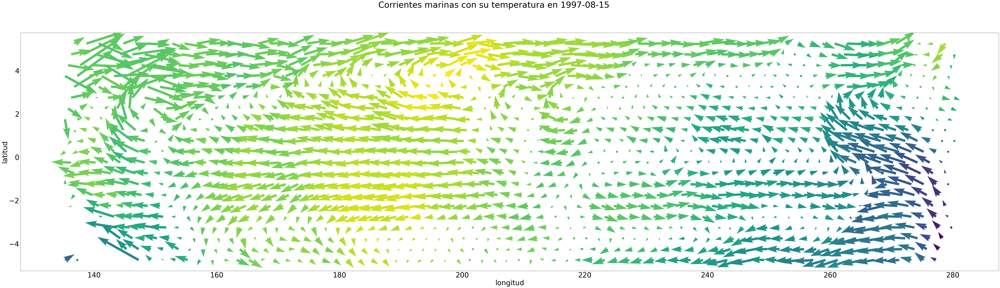

In [21]:
date = "1997-08-15"
df_actual['time'] = pd.to_datetime(df_actual['time (UTC)'], format="%Y-%m-%dT00:00:00Z")
df3=df_actual.where(df_actual['time'] == date).dropna().iloc[::4, :]

print(df3.size)
plt.figure(figsize=(100, 25))
plt.rcParams['font.size']='40'
plt.quiver(df3['longitude (degrees_east)'], df3['latitude (degrees_north)'], df3['u (m s-1)'], df3['v (m s-1)'], df3['temp (degree_C)'], linewidths=0.01)

plt.xlabel('longitud', fontsize=40)
plt.ylabel('latitud', fontsize=40)
plt.suptitle('Corrientes marinas con su temperatura en 1997-08-15')

13509


Text(0.5, 0.98, 'Corrientes marinas con su temperatura en 1997-11-15')

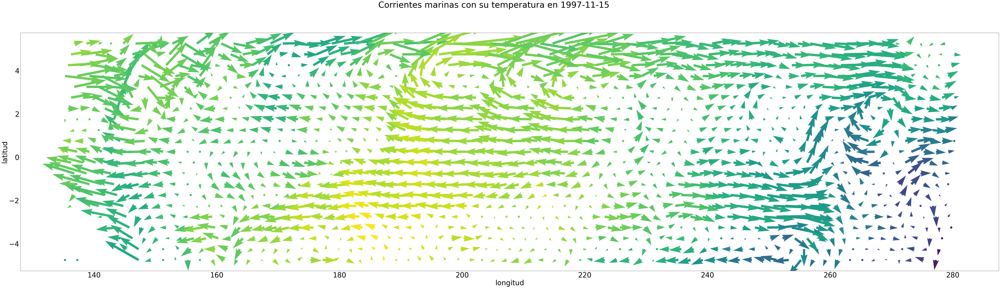

In [23]:
date = "1997-11-15"
df_actual['time'] = pd.to_datetime(df_actual['time (UTC)'], format="%Y-%m-%dT00:00:00Z")
df3=df_actual.where(df_actual['time'] == date).dropna().iloc[::4, :]

print(df3.size)
plt.figure(figsize=(100, 25))
plt.rcParams['font.size']='40'
plt.quiver(df3['longitude (degrees_east)'], df3['latitude (degrees_north)'], df3['u (m s-1)'], df3['v (m s-1)'], df3['temp (degree_C)'], linewidths=0.01)

plt.xlabel('longitud', fontsize=40)
plt.ylabel('latitud', fontsize=40)
plt.suptitle('Corrientes marinas con su temperatura en 1997-11-15')

In [43]:
df_previo['time'] = pd.to_datetime(df_previo['time (UTC)'], format="%Y-%m-%dT00:00:00Z")

,time (UTC),depth (m),latitude (degrees_north),longitude (degrees_east),temp (degree_C),salt (PSU),u (m s-1),v (m s-1),time
0,1984-01-15T00:00:00Z,5.01,-4.75,135.25,29.562305,34.071102,-0.263516,0.037770,1984-01-15
1,1984-01-15T00:00:00Z,5.01,-4.75,135.75,29.568815,34.054290,-0.134401,0.084723,1984-01-15
2,1984-01-15T00:00:00Z,5.01,-4.75,136.25,29.559784,34.039494,-0.001687,0.000681,1984-01-15
3,1984-01-15T00:00:00Z,5.01,-4.75,136.75,29.567688,34.009098,-0.000511,0.000327,1984-01-15
4,1984-01-15T00:00:00Z,5.01,-4.75,137.25,29.717936,33.960155,-0.000112,0.000096,1984-01-15
...,...,...,...,...,...,...,...,...,...
6106,1984-01-15T00:00:00Z,5.01,5.25,278.25,27.763294,31.579021,-0.121054,-0.239616,1984-01-15
6107,1984-01-15T00:00:00Z,5.01,5.25,278.75,27.750505,31.777887,-0.126866,-0.286342,1984-01-15
6108,1984-01-15T00:00:00Z,5.01,5.25,279.25,27.608301,32.099182,-0.133068,-0.313705,1984-01-15
6109,1984-01-15T00:00:00Z,5.01,5.25,279.75,27.279272,32.241817,-0.127870,-0.308923,1984-01-15


In [54]:
df_total_soda = pd.concat([df_previo, df_actual], ignore_index=True)
df_total_soda['time']

0         1970-01-15
1         1970-01-15
2         1970-01-15
3         1970-01-15
4         1970-01-15
             ...    
3012718   2010-12-15
3012719   2010-12-15
3012720   2010-12-15
3012721   2010-12-15
3012722   2010-12-15
Name: time, Length: 3012723, dtype: datetime64[ns]

In [55]:
import cv2
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas


video = cv2.VideoWriter('video.mp4', cv2.VideoWriter_fourcc('A','V','C','1'),5,(5760,1440))
plt.ioff()
for date in df_total_soda['time'].unique()[:]:
    df3=df_total_soda.where(df_total_soda['time'] == date).dropna().iloc[::4, :]
    date=str(date)[:10]
    fig = plt.figure(figsize=(80, 20))
    plt.rcParams['font.size']='36'
    plt.xlabel('longitud', fontsize=36)
    plt.ylabel('latitud', fontsize=36)
    plt.suptitle('Corrientes marinas con su temperatura en '+date)
    plt.quiver(df3['longitude (degrees_east)'], df3['latitude (degrees_north)'], df3['u (m s-1)'], df3['v (m s-1)'], df3['temp (degree_C)'], linewidths=0.01)
    canvas = FigureCanvas(fig)
    canvas.draw()
    mat = np.array(canvas.renderer._renderer)
    mat = cv2.cvtColor(mat, cv2.COLOR_RGB2BGR)
    video.write(mat)
    print(date)
    plt.close(fig)
    
cv2.destroyAllWindows()
video.release()
plt.ion()

1970-01-15
1970-02-15
1970-03-15
1970-04-15
1970-05-15
1970-06-15
1970-07-15
1970-08-15
1970-09-15
1970-10-15
1970-11-15
1970-12-15
1971-01-15
1971-02-15
1971-03-15
1971-04-15
1971-05-15
1971-06-15
1971-07-15
1971-08-15
1971-09-15
1971-10-15
1971-11-15
1971-12-15
1972-01-15
1972-02-15
1972-03-15
1972-04-15
1972-05-15
1972-06-15
1972-07-15
1972-08-15
1972-09-15
1972-10-15
1972-11-15
1972-12-15
1973-01-15
1973-02-15
1973-03-15
1973-04-15
1973-05-15
1973-06-15
1973-07-15
1973-08-15
1973-09-15
1973-10-15
1973-11-15
1973-12-15
1974-01-15
1974-02-15
1974-03-15
1974-04-15
1974-05-15
1974-06-15
1974-07-15
1974-08-15
1974-09-15
1974-10-15
1974-11-15
1974-12-15
1975-01-15
1975-02-15
1975-03-15
1975-04-15
1975-05-15
1975-06-15
1975-07-15
1975-08-15
1975-09-15
1975-10-15
1975-11-15
1975-12-15
1976-01-15
1976-02-15
1976-03-15
1976-04-15
1976-05-15
1976-06-15
1976-07-15
1976-08-15
1976-09-15
1976-10-15
1976-11-15
1976-12-15
1977-01-15
1977-02-15
1977-03-15
1977-04-15
1977-05-15
1977-06-15
1977-07-15

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

In [8]:
date = "1997-08-15"
df_actual['time'] = pd.to_datetime(df_previo['time (UTC)'], format="%Y-%m-%dT00:00:00Z")
df_actual['time']

0         1970-01-15
1         1970-01-15
2         1970-01-15
3         1970-01-15
4         1970-01-15
             ...    
1979959          NaT
1979960          NaT
1979961          NaT
1979962          NaT
1979963          NaT
Name: time, Length: 1979964, dtype: datetime64[ns]

# Overview del dataset

In [79]:
df_anio_p

,d011,d013,d029,d030,d091
Year,,,,,
1985,693.638356,1039.522152,1023.859155,1402.147945,2372.041096
1986,741.400000,1025.328767,1009.590028,1453.970588,2423.232877
1987,724.084932,968.882192,872.174157,1514.115068,2484.435616
1988,536.887978,895.857923,959.311475,1375.232240,2380.412568
1989,654.123288,1009.539726,1036.232877,1424.126027,2419.249315
1990,724.419178,1086.556164,1010.071233,1454.145205,2394.032877
1991,744.669468,1086.827397,993.556164,1501.016438,2441.936986
1992,717.330579,1049.906336,883.073770,1516.872881,2478.811475
1993,700.731507,1058.632877,932.712329,1496.339726,2458.794521


In [89]:
df_anio_p.rename( columns={'d011':'Christmas,KIR', 'd013':'Kantos,KIR', 'd029':'Kapingamarangi,FSM', 'd030':'Santa Cruz,ECU', 'd091':'La Libertad,ECU'}, inplace=True )

In [90]:
df_anio_p.describe()

,"Christmas,KIR","Kantos,KIR","Kapingamarangi,FSM","Santa Cruz,ECU","La Libertad,ECU"
count,29.000000,29.000000,29.000000,29.000000,29.000000
mean,703.459688,1056.331420,1011.911236,1486.483882,2445.527179
std,77.641851,68.798671,67.737623,60.731163,57.766523
min,536.887978,895.857923,844.239316,1375.232240,2357.740437
25%,663.472678,1021.551402,993.556164,1446.691257,2394.032877
50%,705.920765,1058.632877,1023.859155,1479.672131,2448.427397
75%,741.400000,1086.827397,1054.816940,1515.876712,2483.497253
max,873.250000,1247.111111,1144.104730,1663.290055,2572.660274


In [50]:
df_anio_p.mean()

d011     703.459688
d013    1056.331420
d029    1011.911236
d030    1486.483882
d091    2445.527179
dtype: float64

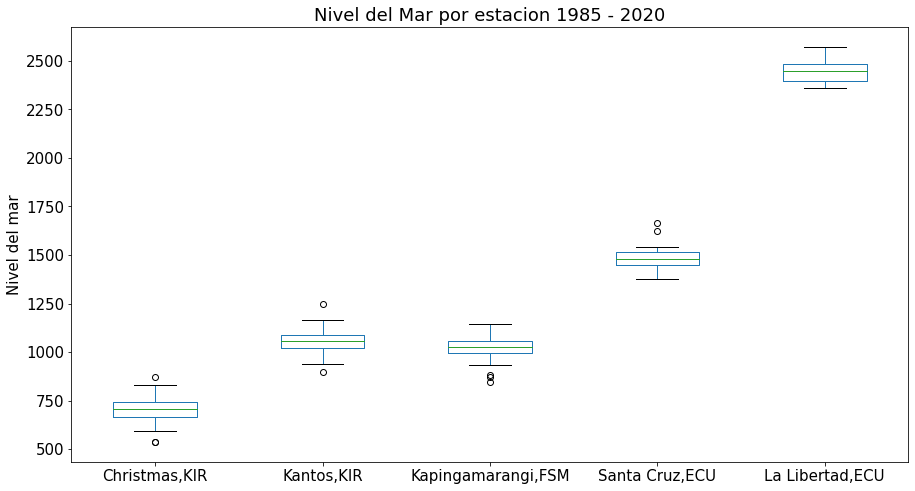

In [125]:
# data = df_anio_p.astype(np.float)

# fig1, ax1 = plt.subplots()
# ax1.set_title('Basic Plot')
# ax1.boxplot(data)

# plt.show()

plt.rc('font', size=15) 
plt.figure(figsize=(15, 8))

df_anio_p.boxplot(grid=False)

plt.title('Nivel del Mar por estacion 1985 - 2020')

# plt.xticks()

# plt.xlabel('Estaciones')
plt.ylabel('Nivel del mar')

plt.show()



In [115]:
df_a

,Year,d011,d013,d029,d030,d091
0,1970,0.000000,0.000000,0.000000,0.000000,2154.921283
1,1971,0.000000,0.000000,0.000000,0.000000,2171.073248
2,1972,0.000000,1122.500000,0.000000,0.000000,2300.151335
3,1973,0.000000,966.728045,0.000000,0.000000,2158.841096
4,1974,611.812883,1021.580822,0.000000,0.000000,2181.734072
5,1975,601.997199,999.323120,0.000000,0.000000,2165.216438
6,1976,718.896440,1074.276712,0.000000,0.000000,2267.166667
7,1977,672.189041,1062.955432,0.000000,0.000000,2201.897351
8,1978,696.056180,1043.383754,1048.350877,1434.410959,2218.233146
9,1979,691.850187,1048.071633,974.951070,1460.534247,2256.416438


In [151]:
df_a.rename( columns={'d011':'Christmas,KIR', 'd013':'Kantos,KIR', 'd029':'Kapingamarangi,FSM', 'd030':'Santa Cruz,ECU', 'd091':'La Libertad,ECU'}, inplace=True )
# df_a.set_index('Year', inplace=True)

,d011,d013,d029,d030,d091
Year,,,,,
1970,1.000000,1.000000,1.000000,1.000000,1.000000
1971,1.000000,1.000000,1.000000,1.000000,1.000000
1972,1.000000,1.000000,1.000000,1.000000,1.000000
1973,1.000000,1.000000,1.000000,1.000000,1.000000
1974,611.812883,1021.580822,0.000000,0.000000,2181.734072
1975,601.997199,999.323120,0.000000,0.000000,2165.216438
1976,718.896440,1074.276712,0.000000,0.000000,2267.166667
1977,672.189041,1062.955432,0.000000,0.000000,2201.897351
1978,696.056180,1043.383754,1048.350877,1434.410959,2218.233146


In [152]:
df_a

,"Christmas,KIR","Kantos,KIR","Kapingamarangi,FSM","Santa Cruz,ECU","La Libertad,ECU"
Year,,,,,
1970,NaN,NaN,NaN,NaN,2154.921283
1971,NaN,NaN,NaN,NaN,2171.073248
1972,NaN,1122.500000,NaN,NaN,2300.151335
1973,NaN,966.728045,NaN,NaN,2158.841096
1974,611.812883,1021.580822,NaN,NaN,2181.734072
1975,601.997199,999.323120,NaN,NaN,2165.216438
1976,718.896440,1074.276712,NaN,NaN,2267.166667
1977,672.189041,1062.955432,NaN,NaN,2201.897351
1978,696.056180,1043.383754,1048.350877,1434.410959,2218.233146


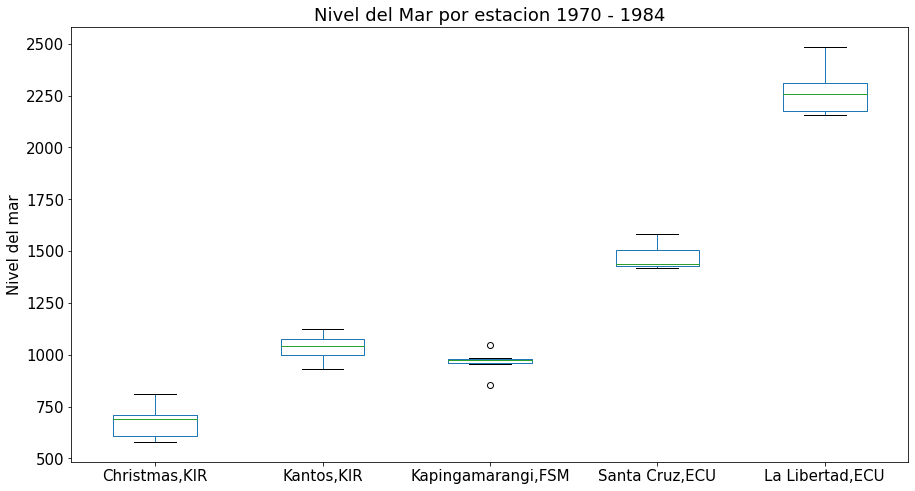

In [153]:
# data = df_anio_p.astype(np.float)

# fig1, ax1 = plt.subplots()
# ax1.set_title('Basic Plot')
# ax1.boxplot(data)

# plt.show()

plt.figure(figsize=(15, 8))

df_a.boxplot(grid=False)

plt.title('Nivel del Mar por estacion 1970 - 1984')

# plt.xticks()

# plt.xlabel('Estaciones')
plt.ylabel('Nivel del mar')

plt.show()


In [34]:
df_sst_1997['sst'].describe()

count    20072.000000
mean        28.381065
std          1.259454
min         22.732560
25%         27.707374
50%         28.722251
75%         29.340994
max         30.417587
Name: sst, dtype: float64

In [37]:
df_sst_1997

,time,latitude,longitude,sst
0,1997-01-16 12:00:00+00:00,5.5,140.5,28.769217
1,1997-01-16 12:00:00+00:00,5.5,141.5,28.805550
2,1997-01-16 12:00:00+00:00,5.5,142.5,28.946290
3,1997-01-16 12:00:00+00:00,5.5,143.5,29.103340
4,1997-01-16 12:00:00+00:00,5.5,144.5,29.271656
...,...,...,...,...
20067,1998-01-16 12:00:00+00:00,-4.5,-85.5,28.673662
20068,1998-01-16 12:00:00+00:00,-4.5,-84.5,28.678600
20069,1998-01-16 12:00:00+00:00,-4.5,-83.5,28.560375
20070,1998-01-16 12:00:00+00:00,-4.5,-82.5,28.400507


In [35]:
df_sst_2015['sst'].describe()

count    20072.000000
mean        28.480370
std          1.472069
min         21.516290
25%         27.541562
50%         28.882884
75%         29.637487
max         30.885612
Name: sst, dtype: float64

In [36]:
df_previo.merge(df_actual).describe()

,depth (m),latitude (degrees_north),longitude (degrees_east),temp (degree_C),salt (PSU),u (m s-1),v (m s-1)
count,6.111000e+03,6111.000000,6111.000000,6027.000000,6027.000000,6004.000000,6004.000000
mean,5.010000e+00,0.250000,207.750000,26.638259,34.571137,-0.321097,0.007385
std,1.776502e-15,3.027898,42.005421,2.040451,0.612478,0.257356,0.144087
min,5.010000e+00,-4.750000,135.250000,21.133053,31.555471,-0.936370,-0.452542
25%,5.010000e+00,-2.250000,171.250000,25.278202,34.316846,-0.489333,-0.092545
50%,5.010000e+00,0.250000,207.750000,26.421160,34.694890,-0.347613,-0.004565
75%,5.010000e+00,2.750000,244.250000,28.524675,34.979900,-0.151244,0.096829
max,5.010000e+00,5.250000,280.250000,30.405230,35.526463,0.513669,0.473262


## Analisis de ONI

In [40]:
df_ONI

,DJF,JFM,FMA,MAM,AMJ,MJJ,JJA,JAS,ASO,SON,OND,NDJ
anio,,,,,,,,,,,,
1950,-1.5,-1.3,-1.2,-1.2,-1.1,-0.9,-0.5,-0.4,-0.4,-0.4,-0.6,-0.8
1951,-0.8,-0.5,-0.2,0.2,0.4,0.6,0.7,0.9,1.0,1.2,1.0,0.8
1952,0.5,0.4,0.3,0.3,0.2,0.0,-0.1,0.0,0.2,0.1,0.0,0.1
1953,0.4,0.6,0.6,0.7,0.8,0.8,0.7,0.7,0.8,0.8,0.8,0.8
1954,0.8,0.5,0.0,-0.4,-0.5,-0.5,-0.6,-0.8,-0.9,-0.8,-0.7,-0.7
...,...,...,...,...,...,...,...,...,...,...,...,...
2017,-0.3,-0.2,0.1,0.2,0.3,0.3,0.1,-0.1,-0.4,-0.7,-0.8,-1.0
2018,-0.9,-0.9,-0.7,-0.5,-0.2,0.0,0.1,0.2,0.5,0.8,0.9,0.8
2019,0.7,0.7,0.7,0.7,0.5,0.5,0.3,0.1,0.2,0.3,0.5,0.5


In [65]:
df_ONI_test = df_ONI.stack()
df_ONI_test[1950]

DJF   -1.5
JFM   -1.3
FMA   -1.2
MAM   -1.2
AMJ   -1.1
MJJ   -0.9
JJA   -0.5
JAS   -0.4
ASO   -0.4
SON   -0.4
OND   -0.6
NDJ   -0.8
dtype: float64

In [41]:
df_ONI.loc[2015]

DJF    0.5
JFM    0.5
FMA    0.5
MAM    0.7
AMJ    0.9
MJJ    1.2
JJA    1.5
JAS    1.9
ASO    2.2
SON    2.4
OND    2.6
NDJ    2.6
Name: 2015, dtype: float64

In [ ]:


# Dataframe desde 1985 hasta 2020
df_ONI_8520 = df_ONI.loc[ (df_ONI['anio']>1984) & (df_ONI['anio']<= 2020) ]
# df_ONI_8520.reset_index(inplace=True, drop=True)
# df_ONI_8520.set_index('anio', inplace=True)
df_ONI_8520.head()

Text(0.5, 0.98, 'Diferencias de temperatura de cada mes en el periodo 1950-2021')

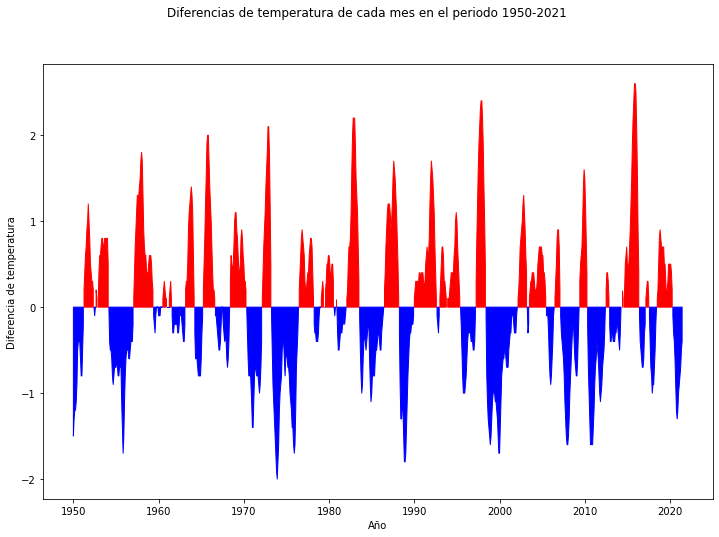

In [100]:
y = df_ONI.stack().to_frame().to_numpy()
y_positive = y.copy()
y_negative = y.copy()

y_positive[y_positive<=0] = np.nan
y_negative[y_negative>0] = np.nan

x = np.arange(1950, 2022, 1/12)[:-6]

plt.figure(figsize=(12,8))
plt.fill_between(x,y_positive.ravel(), color="r")
plt.fill_between(x,y_negative.ravel(), color="b")
plt.xlabel('Año')
plt.ylabel('Diferencia de temperatura')
plt.suptitle('Diferencias de temperatura de cada mes en el periodo 1950-2021')

Text(0.5, 0.98, 'Diferencias de temperatura de cada mes en entre 1994 y 1999')

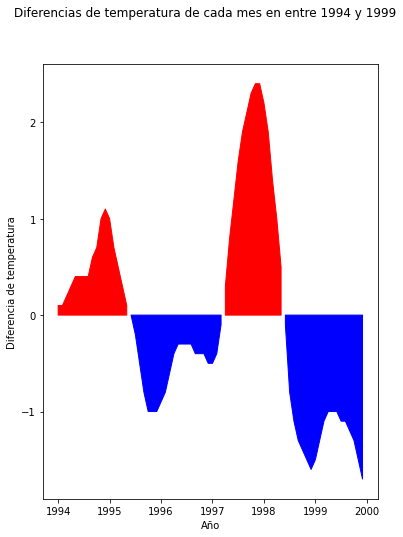

In [106]:
index_1997 = (1994-1950)*12
y_1997_positive = y_positive[index_1997:index_1997+12*6]
y_1997_negative = y_negative[index_1997:index_1997+12*6]
x_1997 = x[index_1997:index_1997+12*6]

plt.figure(figsize=(6,8))
plt.fill_between(x_1997,y_1997_positive.ravel(), color="r")
plt.fill_between(x_1997,y_1997_negative.ravel(), color="b")
plt.xlabel('Año')
plt.ylabel('Diferencia de temperatura')
plt.suptitle('Diferencias de temperatura de cada mes en entre 1994 y 1999')

Text(0.5, 0.98, 'Diferencias de temperatura de cada mes entre 2012 y 2017')

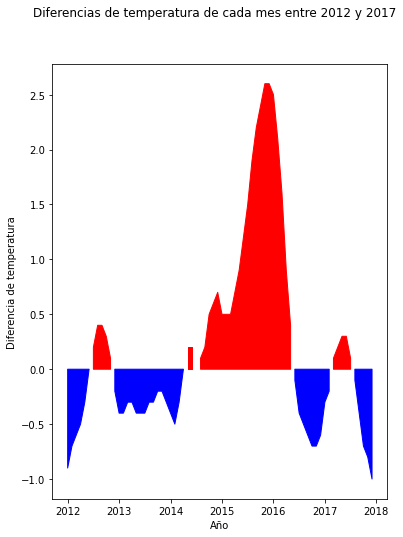

In [107]:
index_2015 = (2012-1950)*12
y_2015_positive = y_positive[index_2015:index_2015+12*6]
y_2015_negative = y_negative[index_2015:index_2015+12*6]
x_2015 = x[index_2015:index_2015+12*6]

plt.figure(figsize=(6,8))

plt.fill_between(x_2015,y_2015_positive.ravel(), color="r")
plt.fill_between(x_2015,y_2015_negative.ravel(), color="b")
plt.xlabel('Año')
plt.ylabel('Diferencia de temperatura')
plt.suptitle('Diferencias de temperatura de cada mes entre 2012 y 2017')

## Clustering

In [45]:
#Normalización de datos
df_cluster = df_previo.append(df_actual, ignore_index=True)[['temp (degree_C)', 'salt (PSU)']].dropna()
df_cluster = (df_cluster - df_cluster.mean())/df_cluster.std()
df_cluster

,temp (degree_C),salt (PSU)
0,0.642540,-0.677033
1,0.707488,-0.661542
2,0.746383,-0.626811
3,0.773255,-0.639533
4,0.823067,-0.740118
...,...,...
3012718,-0.120742,-4.524004
3012719,-0.141230,-4.939522
3012720,-0.217859,-4.769391
3012721,-0.275549,-4.420688


AttributeError: 'KMeans' object has no attribute 'k'

AttributeError: 'KMeans' object has no attribute 'k'

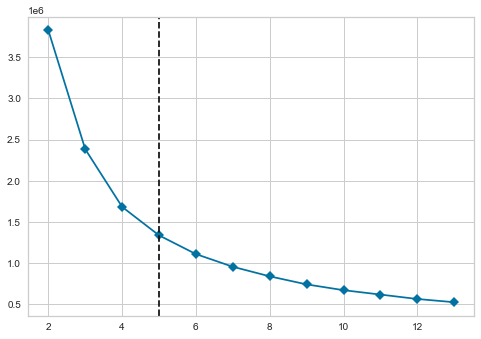

In [47]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

#Validación de número óptimo de clusters usando KEblbow
model = KMeans()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,14), timings=False)
visualizer.fit(df_cluster)


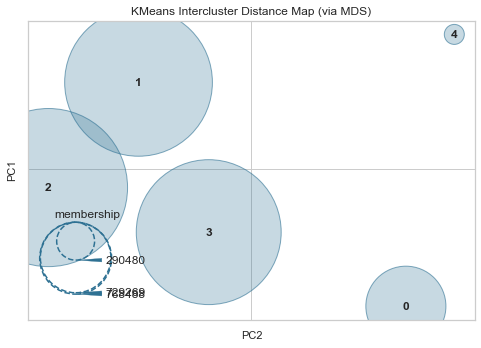

<AxesSubplot:title={'center':'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [50]:
from yellowbrick.cluster import InterclusterDistance
kmeans = KMeans(n_clusters=5)
visualizer = InterclusterDistance(kmeans, random_state=0)
visualizer.fit(df_cluster)        # Fit the data to the visualizer
visualizer.show()  

In [53]:
kmeans_y = kmeans.fit(df_cluster)

In [62]:
centroids = list(kmeans_y.cluster_centers_) #[[x1,y1], [x2,y2]...]
df_clustering = df_cluster.copy()
df_clustering['cluster'] = kmeans_y.labels_

In [86]:
#df_clustering['center_temp'] = df_clustering.apply(lambda row : centroids[int(row['cluster'])][0], axis=1)
#df_clustering['center_salt'] = df_clustering.apply(lambda row : centroids[int(row['cluster'])][1], axis=1)
def distance(row):  #distancia euclidiana
    return (((centroids[int(row['cluster'])][1]-row['salt (PSU)'])**2) + ((centroids[int(row['cluster'])][0]-row['temp (degree_C)'])**2))**(1/2)
df_clustering['distance'] = df_clustering.apply(lambda row : distance(row), axis=1)
df_clustering

,temp (degree_C),salt (PSU),cluster,distance
0,0.642540,-0.677033,0,0.270134
1,0.707488,-0.661542,0,0.213824
2,0.746383,-0.626811,0,0.162470
3,0.773255,-0.639533,0,0.159264
4,0.823067,-0.740118,0,0.244322
...,...,...,...,...
3012718,-0.120742,-4.524004,1,2.189128
3012719,-0.141230,-4.939522,1,2.601808
3012720,-0.217859,-4.769391,1,2.427799
3012721,-0.275549,-4.420688,1,2.077516


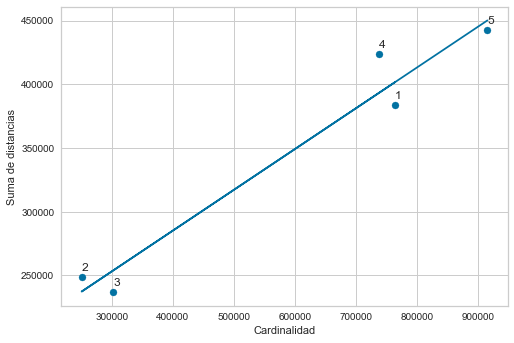

In [111]:
x,y = df_clustering.groupby('cluster')['distance'].count(),df_clustering.groupby('cluster')['distance'].sum().tolist()
#x: cardinalidad de clusters
#y: suma de distancias del cluster
m, b = np.polyfit(x, y, 1)
plt.scatter( x,y )
for i in range(len(x)):
    plt.annotate(str(i+1), (x[i], y[i]+5000))
plt.xlabel("Cardinalidad")
plt.ylabel("Suma de distancias")
plt.plot(x, m*x+b)

In [112]:
centroids

[array([ 0.84363531, -0.49666368]),
 array([-0.31550503, -2.34355654]),
 array([-2.0935127, -0.0059728]),
 array([-0.58279983,  0.39884329]),
 array([0.54536761, 0.74100238])]

Evaluando los valores de cada centroide con su cardinalidad, se puede observar que los clusters 2 y 3 (de indices 1 y 2) son los de menor cardinalidad, y al mismo tiempo son clusters con valores de salinidad y temperatura respectivamente, muy inferiores a la media. Por otro lado, los otros 3 clusters son de la relación "a mayor temperatura menor salinidad" (cluster 1), "a mayor salinidad, menor temperatura" (cluster 4) y "a mayor temperatura, mayor salinidad y viceversa" (cluster 5).

Como estas últimas tres relaciones tienen cardinalidades relativamente similares, y las métricas de clustering no rechazan la metodología, no se puede concluir que exista una relación significativa entre estas dos variables.

Se usa como métrica la distancia euclidiana, porque son dos valores escalares como la salinidad y la temperatura.

Se usó el método Elbow para evaluar una cantidad ideal de centroides k.

Se compara la suma de distancias con la cardinalidad para detectar algún cluster anómalo

## Social Network Analysis

In [53]:
import nltk
import json

In [62]:
# JSON con tweets que contiene la palabra sea level rise
f = open('data/tweets/sea level rise.json')
data = json.load(f)

data = data['statuses']


data

[{'created_at': 'Mon Aug 16 06:16:34 +0000 2021',
  'id': 1427152283456790528,
  'id_str': '1427152283456790528',
  'full_text': 'RT @RichieMerzian: Less than a week following the #IPCC report and the Oz is back in full swing \n\nHow good is Australia ignoring scientists…',
  'truncated': False,
  'display_text_range': [0, 140],
  'entities': {'hashtags': [{'text': 'IPCC', 'indices': [50, 55]}],
   'symbols': [],
   'user_mentions': [{'screen_name': 'RichieMerzian',
     'name': 'Richie Merzian',
     'id': 94079202,
     'id_str': '94079202',
     'indices': [3, 17]}],
   'urls': []},
  'metadata': {'iso_language_code': 'en', 'result_type': 'recent'},
  'source': '<a href="http://twitter.com/#!/download/ipad" rel="nofollow">Twitter for iPad</a>',
  'in_reply_to_status_id': None,
  'in_reply_to_status_id_str': None,
  'in_reply_to_user_id': None,
  'in_reply_to_user_id_str': None,
  'in_reply_to_screen_name': None,
  'user': {'id': 1026069439,
   'id_str': '1026069439',
   'name': 'Chr

In [64]:
t_sealevel = []

for t in data:
    t_sealevel.append(t['full_text'])

In [65]:
t_sealevel

['RT @RichieMerzian: Less than a week following the #IPCC report and the Oz is back in full swing \n\nHow good is Australia ignoring scientists…',
 '@brianmoore666 Enjoy the view while you can climate change and sea level rise will eventually make it a thing of the past',
 'RT @350: 1. A few data points to start: \n📈 CO2 concentration is the highest in TWO MILLION YEARS\n🌡️The last decade was hotter than any peri…',
 'RT @JytteGuteland: The worst case scenarios show catastrophic consequences on for example sea level rise that would make many densely popul…',
 "RT @FFFIndia: What can be more worse than this🙄\nState's Env minister cheering for a Coastal road inv 111 hectares of sea reclamation,destro…",
 'In 2017, I testified in the WaterFix Water Right Change Petition hearing that @CA_DWR needed to consider the performance of the North Delta intakes with sea level rise of up to 2.5 m, based on the 2017 US National Climate Assessment. #Deltatunnel',
 'RT @RichieMerzian: Less than a week 